# Anticipating the electricity consumption needs and greenhouse gas emissions of non-residential properties in Seattle
# Notebook 1 - EDA, feature engineering and data preprocessing

# Objective of the notebook

Data exploration, cleaning, analysis and feature engineering in order to build a dataframe with relevant and preprocessed features to export for use in models within the next notebooks.

# Data sources

Consumption data can be downloaded at this <a href="https://s3.eu-west-1.amazonaws.com/course.oc-static.com/projects/Data_Scientist_P4/2016_Building_Energy_Benchmarking.csv" target="_blank">address</a>.

More details about the Energy Star score <a href="https://www.energystar.gov/buildings/benchmark/analyze_benchmarking_results" target="_blank">here</a>.

The description of features can be consulted on the <a href="https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy" target="_blank">Seattle city website</a>.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Anticipating-the-electricity-consumption-needs-and-greenhouse-gas-emissions-of-non-residential-properties-in-Seattle" data-toc-modified-id="Anticipating-the-electricity-consumption-needs-and-greenhouse-gas-emissions-of-non-residential-properties-in-Seattle-1">Anticipating the electricity consumption needs and greenhouse gas emissions of non-residential properties in Seattle</a></span></li><li><span><a href="#Notebook-1---EDA,-feature-engineering-and-data-preprocessing" data-toc-modified-id="Notebook-1---EDA,-feature-engineering-and-data-preprocessing-2">Notebook 1 - EDA, feature engineering and data preprocessing</a></span></li><li><span><a href="#Objective-of-the-notebook" data-toc-modified-id="Objective-of-the-notebook-3">Objective of the notebook</a></span></li><li><span><a href="#Data-sources" data-toc-modified-id="Data-sources-4">Data sources</a></span></li><li><span><a href="#I)-Importation-of-the-dataset-into-a-pandas-dataframe" data-toc-modified-id="I)-Importation-of-the-dataset-into-a-pandas-dataframe-5">I) Importation of the dataset into a pandas dataframe</a></span><ul class="toc-item"><li><span><a href="#1)-Importation-of-all-librairies-and-tools-required-to-realize-the-project-and-set-the-first-global-variables" data-toc-modified-id="1)-Importation-of-all-librairies-and-tools-required-to-realize-the-project-and-set-the-first-global-variables-5.1">1) Importation of all librairies and tools required to realize the project and set the first global variables</a></span></li><li><span><a href="#2)-Importation-of-the-raw-dataset" data-toc-modified-id="2)-Importation-of-the-raw-dataset-5.2">2) Importation of the raw dataset</a></span><ul class="toc-item"><li><span><a href="#a)-Check-the-first-rows-of-the-dataset-to-determine-which-data-separator-is-used" data-toc-modified-id="a)-Check-the-first-rows-of-the-dataset-to-determine-which-data-separator-is-used-5.2.1">a) Check the first rows of the dataset to determine which data separator is used</a></span></li><li><span><a href="#b)-Importation-of-the-dataset-into-a-pandas-dataframe" data-toc-modified-id="b)-Importation-of-the-dataset-into-a-pandas-dataframe-5.2.2">b) Importation of the dataset into a pandas dataframe</a></span></li><li><span><a href="#c)-Check-if-the-importation-happened-well" data-toc-modified-id="c)-Check-if-the-importation-happened-well-5.2.3">c) Check if the importation happened well</a></span></li></ul></li></ul></li><li><span><a href="#II)-Data-overview" data-toc-modified-id="II)-Data-overview-6">II) Data overview</a></span><ul class="toc-item"><li><span><a href="#1)-Functions" data-toc-modified-id="1)-Functions-6.1">1) Functions</a></span><ul class="toc-item"><li><span><a href="#a)-Definition" data-toc-modified-id="a)-Definition-6.1.1">a) Definition</a></span></li></ul></li><li><span><a href="#2)-Raw-dataset-general-description" data-toc-modified-id="2)-Raw-dataset-general-description-6.2">2) Raw dataset general description</a></span><ul class="toc-item"><li><span><a href="#a)-Raw-dataset" data-toc-modified-id="a)-Raw-dataset-6.2.1">a) Raw dataset</a></span></li><li><span><a href="#b)-Raw-dataset-global-description" data-toc-modified-id="b)-Raw-dataset-global-description-6.2.2">b) Raw dataset global description</a></span></li><li><span><a href="#c)-Dataset-fragmented-and-sorted-by-the-percentage-of-filled-columns" data-toc-modified-id="c)-Dataset-fragmented-and-sorted-by-the-percentage-of-filled-columns-6.2.3">c) Dataset fragmented and sorted by the percentage of filled columns</a></span></li></ul></li><li><span><a href="#3)-Filter-to-stay-in-the-frame-of-the-project:-Selection-of-the-non-dwelling-buidings" data-toc-modified-id="3)-Filter-to-stay-in-the-frame-of-the-project:-Selection-of-the-non-dwelling-buidings-6.3">3) Filter to stay in the frame of the project: Selection of the non-dwelling buidings</a></span><ul class="toc-item"><li><span><a href="#a)-Selection" data-toc-modified-id="a)-Selection-6.3.1">a) Selection</a></span></li><li><span><a href="#b)-New-description" data-toc-modified-id="b)-New-description-6.3.2">b) New description</a></span></li></ul></li></ul></li><li><span><a href="#III)-Data-cleaning-&amp;-feature-engineering" data-toc-modified-id="III)-Data-cleaning-&amp;-feature-engineering-7">III) Data cleaning &amp; feature engineering</a></span><ul class="toc-item"><li><span><a href="#1)-Removal-of-rows-which-are-too-empty" data-toc-modified-id="1)-Removal-of-rows-which-are-too-empty-7.1">1) Removal of rows which are too empty</a></span></li><li><span><a href="#2)-Removal-of-columns-with-only-one-kind-of-value-or-no-values" data-toc-modified-id="2)-Removal-of-columns-with-only-one-kind-of-value-or-no-values-7.2">2) Removal of columns with only one kind of value or no values</a></span></li><li><span><a href="#3)-Removal-of-the-first-outliers-rows" data-toc-modified-id="3)-Removal-of-the-first-outliers-rows-7.3">3) Removal of the first outliers rows</a></span></li><li><span><a href="#4)-Removal-of-redundant-variables" data-toc-modified-id="4)-Removal-of-redundant-variables-7.4">4) Removal of redundant variables</a></span><ul class="toc-item"><li><span><a href="#a)-Check-if-imputations-are-possible" data-toc-modified-id="a)-Check-if-imputations-are-possible-7.4.1">a) Check if imputations are possible</a></span><ul class="toc-item"><li><span><a href="#i.-Between-WN-suffixed-and-not-suffixed-features" data-toc-modified-id="i.-Between-WN-suffixed-and-not-suffixed-features-7.4.1.1">i. Between WN suffixed and not suffixed features</a></span></li><li><span><a href="#ii.-Check-if-some-outliers-can-be-detected." data-toc-modified-id="ii.-Check-if-some-outliers-can-be-detected.-7.4.1.2">ii. Check if some outliers can be detected.</a></span></li><li><span><a href="#iii.-Check-if-some-NaN-could-be-imputed" data-toc-modified-id="iii.-Check-if-some-NaN-could-be-imputed-7.4.1.3">iii. Check if some NaN could be imputed</a></span></li><li><span><a href="#iv.-Removal-of-the-redudant-columns" data-toc-modified-id="iv.-Removal-of-the-redudant-columns-7.4.1.4">iv. Removal of the redudant columns</a></span></li></ul></li></ul></li><li><span><a href="#5)-Aberrant-or-particularly-uncommon-values" data-toc-modified-id="5)-Aberrant-or-particularly-uncommon-values-7.5">5) Aberrant or particularly uncommon values</a></span><ul class="toc-item"><li><span><a href="#a)-Check-negative-outliers" data-toc-modified-id="a)-Check-negative-outliers-7.5.1">a) Check negative outliers</a></span><ul class="toc-item"><li><span><a href="#i.-Energy-consumption-and-gas-emissions" data-toc-modified-id="i.-Energy-consumption-and-gas-emissions-7.5.1.1">i. Energy consumption and gas emissions</a></span></li></ul></li><li><span><a href="#b)-Check-null-outliers" data-toc-modified-id="b)-Check-null-outliers-7.5.2">b) Check null outliers</a></span><ul class="toc-item"><li><span><a href="#i.-Energy-consumption-and-gas-emissions" data-toc-modified-id="i.-Energy-consumption-and-gas-emissions-7.5.2.1">i. Energy consumption and gas emissions</a></span></li><li><span><a href="#ii.-No-buildings-in-a-property" data-toc-modified-id="ii.-No-buildings-in-a-property-7.5.2.2">ii. No buildings in a property</a></span></li><li><span><a href="#iii.-No-floor-in-a-building" data-toc-modified-id="iii.-No-floor-in-a-building-7.5.2.3">iii. No floor in a building</a></span></li></ul></li></ul></li><li><span><a href="#6)-Seattle-main-areas" data-toc-modified-id="6)-Seattle-main-areas-7.6">6) Seattle main areas</a></span><ul class="toc-item"><li><span><a href="#a)-Neighborhood" data-toc-modified-id="a)-Neighborhood-7.6.1">a) Neighborhood</a></span></li><li><span><a href="#b)-ZipCode" data-toc-modified-id="b)-ZipCode-7.6.2">b) ZipCode</a></span></li></ul></li><li><span><a href="#7)-Localization-of-the-different-properties-on-a-map" data-toc-modified-id="7)-Localization-of-the-different-properties-on-a-map-7.7">7) Localization of the different properties on a map</a></span><ul class="toc-item"><li><span><a href="#a)-Localization-by-council-districts" data-toc-modified-id="a)-Localization-by-council-districts-7.7.1">a) Localization by council districts</a></span></li><li><span><a href="#b)-Localization-by-Neigbourhood-ID" data-toc-modified-id="b)-Localization-by-Neigbourhood-ID-7.7.2">b) Localization by Neigbourhood ID</a></span></li><li><span><a href="#c)-Localization-by-ZipCode" data-toc-modified-id="c)-Localization-by-ZipCode-7.7.3">c) Localization by ZipCode</a></span></li><li><span><a href="#d)-Localization-by-total-energy-consumption" data-toc-modified-id="d)-Localization-by-total-energy-consumption-7.7.4">d) Localization by total energy consumption</a></span></li><li><span><a href="#e)-Localization-by-total-GHG-emissions" data-toc-modified-id="e)-Localization-by-total-GHG-emissions-7.7.5">e) Localization by total GHG emissions</a></span></li></ul></li><li><span><a href="#8)-Building-usage" data-toc-modified-id="8)-Building-usage-7.8">8) Building usage</a></span><ul class="toc-item"><li><span><a href="#a)-Choice-of-the-column-to-represent-the-main-building-usage" data-toc-modified-id="a)-Choice-of-the-column-to-represent-the-main-building-usage-7.8.1">a) Choice of the column to represent the main building usage</a></span><ul class="toc-item"><li><span><a href="#i.-Comparison" data-toc-modified-id="i.-Comparison-7.8.1.1">i. Comparison</a></span></li><li><span><a href="#ii.-Check-if-imputations-are-possible" data-toc-modified-id="ii.-Check-if-imputations-are-possible-7.8.1.2">ii. Check if imputations are possible</a></span></li><li><span><a href="#iii.-Remap-for-encoding" data-toc-modified-id="iii.-Remap-for-encoding-7.8.1.3">iii. Remap for encoding</a></span></li></ul></li></ul></li><li><span><a href="#9)-NaN-management" data-toc-modified-id="9)-NaN-management-7.9">9) NaN management</a></span><ul class="toc-item"><li><span><a href="#a)-Property-Usage" data-toc-modified-id="a)-Property-Usage-7.9.1">a) Property Usage</a></span><ul class="toc-item"><li><span><a href="#i.-NaN-in-largest-property-usage" data-toc-modified-id="i.-NaN-in-largest-property-usage-7.9.1.1">i. NaN in largest property usage</a></span></li><li><span><a href="#ii.-NaN-replacement-by-&quot;No-usage&quot;-for-the-PropertyUseTypes" data-toc-modified-id="ii.-NaN-replacement-by-&quot;No-usage&quot;-for-the-PropertyUseTypes-7.9.1.2">ii. NaN replacement by "No usage" for the PropertyUseTypes</a></span></li><li><span><a href="#iii.-NaN-replacement-by-0-for-NaN-surfaces-for-the-PropertyUseTypeGFA" data-toc-modified-id="iii.-NaN-replacement-by-0-for-NaN-surfaces-for-the-PropertyUseTypeGFA-7.9.1.3">iii. NaN replacement by 0 for NaN surfaces for the PropertyUseTypeGFA</a></span></li></ul></li></ul></li><li><span><a href="#10)-Minimizing-the-number-of-categorical-features-to-encode-and-removal-of-left-useless-features" data-toc-modified-id="10)-Minimizing-the-number-of-categorical-features-to-encode-and-removal-of-left-useless-features-7.10">10) Minimizing the number of categorical features to encode and removal of left useless features</a></span></li><li><span><a href="#11)-Data-encoding" data-toc-modified-id="11)-Data-encoding-7.11">11) Data encoding</a></span><ul class="toc-item"><li><span><a href="#a)-Encoding-of-the-property-main-usages" data-toc-modified-id="a)-Encoding-of-the-property-main-usages-7.11.1">a) Encoding of the property main usages</a></span></li><li><span><a href="#b)-Properties'-surface-feature" data-toc-modified-id="b)-Properties'-surface-feature-7.11.2">b) Properties' surface feature</a></span></li></ul></li><li><span><a href="#12)-Last-features-to-drop" data-toc-modified-id="12)-Last-features-to-drop-7.12">12) Last features to drop</a></span></li><li><span><a href="#13)-Export-the-preprocessed-dataset-in-CSV-format" data-toc-modified-id="13)-Export-the-preprocessed-dataset-in-CSV-format-7.13">13) Export the preprocessed dataset in CSV format</a></span></li></ul></li></ul></div>

# I) Importation of the dataset into a pandas dataframe

## 1) Importation of all librairies and tools required to realize the project and set the first global variables

In [1]:
### File management ###

import os
from pathlib import Path


### Data manipulations ###

import numpy as np
from numpy import set_printoptions # Saving full data when exporting to csv format.
import pandas as pd


### Date & time ###

# Time measurment and datetime management
#import datetime as dt
#from time import time


### Data visualizations ###

#from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns


### Warnings management ###

import warnings
warnings.filterwarnings('ignore')


### Figures default parameters ###

# Sets the default matplotlib parameters for the whole notebook.
plt.rcParams["figure.figsize"] = [16,9]
plt.rcParams['figure.dpi'] = 200
plt.rcParams["axes.spines.right"] = False
plt.rcParams["axes.spines.top"] = False
plt.rcParams["xtick.bottom"] = True
plt.rcParams["ytick.left"] = True

# Default parameters of seaborn's figures.
default_palette = 'deep' # Other keywords: 'deep', 'muted', 'bright', 'tab10', 'hsl', 'husl', 'paired'.
sns.set_style('white') # NB: Needs to be above sns.set_theme to properly attend custom_params.
custom_params = {'axes.spines.right': False, 'axes.spines.top': False}
sns.set_theme(style='ticks', palette=default_palette, rc=custom_params)

# Display color palettes.
# NB1: Check this link for more color palette options: https://seaborn.pydata.org/tutorial/color_palettes.html
# NB2: Check this link for more figure's dot symbols options: http://www.python-simple.com/python-matplotlib/scatterplot.php
print('Default color palette of the sns figures in the notebook:')
display(sns.color_palette(default_palette, 10))


### Global file paths ###

# Get the project file path.
tup_NB_PATH = Path(os.getcwd()).parts # Get the absolute current folder path of the notebook and split it in a tuple.
PROJ_PATH = os.path.join(*tup_NB_PATH[:tup_NB_PATH.index('P4')+1]) # Get the absolute project folder path by truncing the notebook path at the project folder.

# Main file paths.
DATASET_PATH = os.path.join("Dataset", "2016_Building_Energy_Benchmarking.csv")

# Check paths.
print('Project\'s folder path:          ' + PROJ_PATH +
      '\nDataset\'s path:                 ' + DATASET_PATH +
      '\nCurrent notebook\'s folder path: ' + os.getcwd()
     )

Default color palette of the sns figures in the notebook:


[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

Project's folder path:          D:\_MP-P2P\MP_P2P-Pro\Archives\Etudes\2023-OC-DS\P4
Dataset's path:                 Dataset\2016_Building_Energy_Benchmarking.csv
Current notebook's folder path: D:\_MP-P2P\MP_P2P-Pro\Archives\Etudes\2023-OC-DS\P4\GitRepo


## 2) Importation of the raw dataset

### a) Check the first rows of the dataset to determine which data separator is used

In [2]:
def read_csv_line (line_nb, csv_path=DATASET_PATH):
    
    """ Open and display the dataset table. """
    
    opened_csv = open(csv_path)
    
    line = ""
    for line_cnt in range(line_nb+1):
        line = opened_csv.readline()
        
    print(">>>>>> Line %d" % (line_cnt))
    print(line)

In [3]:
%%time

read_csv_line(0)
read_csv_line(1)
read_csv_line(10)

>>>>>> Line 0
OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity

>>>>>> Line 1
1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101,0659000030,7,DOWNTOWN,47.6122,-122.33799,1927,1,12,88434,0,88434,Hotel,Hotel,88434,,,

##### Conclusion

It seems that in this csv dataset the separator used is the comma.<br>
    => Add the argument: sep = ',' to pd.read_csv for a proper importation.

### b) Importation of the dataset into a pandas dataframe

In [4]:
%%time

# Make a dataframe to store the raw data.
data_raw = pd.read_csv(DATASET_PATH, sep = ',')

display(data_raw)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,...,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,...,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,...,5.252517e+05,1.792159e+06,39737.390630,3.973739e+06,False,NaN,Compliant,NaN,223.54,16.99
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,...,1.022480e+05,3.488702e+05,3706.010010,3.706010e+05,False,NaN,Compliant,NaN,22.11,1.57


Wall time: 41 ms


### c) Check if the importation happened well

In [5]:
%%time

nb_lines = sum(1 for line in open(DATASET_PATH, encoding='utf-8'))
msg = (
f"Number of lines in the csv dataset (with header): {nb_lines}\n"
f"Number of rows in the dataset (without header): {data_raw.shape[0]}"
)
print(msg)

Number of lines in the csv dataset (with header): 3377
Number of rows in the dataset (without header): 3376
Wall time: 2 ms


##### Conclusion

There are as many lines in the csv dataset as in the dataframe which contains the dataset.<br> => Thus the dataset looks to have been well imported in the dataframe.

# II) Data overview

## 1) Functions

### a) Definition

In [6]:
def dataset_basic_description(df, data_in_col_threshold = 75, data_in_row_threshold = 75):
    
    """ Short description of the dataset. """
    
    # Counts the number of rows and columns.
    nb_of_rows_int, nb_of_cols_int = df.shape

    # Counts the number of cells.
    nb_of_cells_int = df.size

    # Checking if there are duplicates.
    nb_of_duplicates_int = df.duplicated(keep='first').sum()
    
    # Determining which are the columns filled over the threshold value and calculating the number and the ratio 
    # of the columns filled over this threshold value.
    cols_over_threshold_lst = (df.notnull().sum() / nb_of_rows_int * 100) > data_in_col_threshold
    nb_of_cols_over_threshold_int = cols_over_threshold_lst.sum()
    ratio_of_filled_cols_flt = round(nb_of_cols_over_threshold_int / nb_of_cols_int * 100, 2)
    
    # Determining which are the rows filled over the threshold value and calculating the number and the ratio 
    # of the rows filled over this threshold value.
    rows_over_threshold_lst = (df.notnull().sum(axis=1) / nb_of_cols_int * 100) > data_in_row_threshold
    nb_of_rows_over_threshold_int = rows_over_threshold_lst.sum()
    ratio_of_filled_rows_flt = round(nb_of_rows_over_threshold_int / nb_of_rows_int * 100, 2)
    
    # Calculating the number of filled cells.
    nb_of_filled_cells_int = df.notnull().sum().sum()

    # Ratio of cells filled over the total number of cells.
    ratio_of_filled_cells_flt = round(nb_of_filled_cells_int / nb_of_cells_int * 100, 2)
    
    # All values are put together in a dataframe.
    dataset_description = pd.DataFrame({'Raw Dataset Basic Description': [nb_of_rows_int, 
                                                                nb_of_cols_int, 
                                                                nb_of_cells_int,
                                                                nb_of_duplicates_int,
                                                                nb_of_cols_over_threshold_int,
                                                                ratio_of_filled_cols_flt,
                                                                nb_of_rows_over_threshold_int,
                                                                ratio_of_filled_rows_flt, 
                                                                nb_of_filled_cells_int, 
                                                                ratio_of_filled_cells_flt]},
                                                        index=['Number of rows', 
                                                               'Number of columns', 
                                                               'Number of cells', 
                                                               'Number of duplicated rows', 
                                                               'Number of columns filled over {0:.2f} %'.format(data_in_col_threshold),
                                                               'Ratio of filled columns over {0:.2f} % (%)'.format(data_in_col_threshold),
                                                               'Number of rows filled over {0:.2f} %'.format(data_in_row_threshold),
                                                               'Ratio of filled rows over {0:.2f} % (%)'.format(data_in_row_threshold),
                                                               'Number of filled cells', 
                                                               'Ratio of filled cells (%)'])
    
    # Calculate the statistic parameters for every column having integer or float type values.
    df_stats_df = df.describe()
   

    return dataset_description, df_stats_df

In [7]:
def data_filled_ratio (df):
    
    """ Calculate the ratio of filled cells by rows and columns. """
    
    # Calculate and sort the ratio of filled cells by columns.  
    cols_filled_ratio = pd.DataFrame((df.count() / df.shape[0] * 100).sort_values(axis=0, ascending=False), columns=['Ratio of Filled Cells by Columns (%)'])
    
    # Calculate and sort the ratio of filled cells by rows.    
    data_filled_ratio_rows_df = pd.DataFrame((df.count(axis=1) / df.shape[1] * 100).sort_values(axis=0, ascending=False), columns=['Ratio of Filled Cells by Rows (%)'])

    return cols_filled_ratio, data_filled_ratio_rows_df

In [8]:
def display_EZ (df, max_rows = 100, max_cols = 100, max_colwidth = 100):
    
    """
    Description
    -----------
    Allows to display pandas dataframes with the number of rows and columns whished in an easy manner.
    
    Parameters
    ----------
    df: pandas.DataFrame()
        Dataframe to display.
    max_rows: int
        Maximum number of rows to display.
    max_cols: int
        Maximum number of columns to display.
    max_colwidth: int
        Maximum width of each column.
        
    """
    
    with pd.option_context('display.max_rows', max_rows, 'display.max_columns', max_cols, 'display.max_colwidth', max_colwidth):
        display(df)

In [9]:
def matching_rows (df, col1_name, col2_name, fit_object):

    """
    Description
    -----------
    Allows to compare two columns and check on which rows the cell values fit for both columns.
    
    Parameters
    ----------
    df: dataframe
        Dataframe to process.
    col1_name: str
        Name of the first column to compare.
    col2_name: str
        Name of the second column to compare.
        
    """    
   
    # Creating the excluding mask "mask_unmatching_rows".
    mask_col1 = df[col1_name] == fit_object
    mask_col2 = df[col2_name] == fit_object
        
    # Creation of a mask to keep only matching rows by NaN.
    mask_matching_rows = mask_col1 & mask_col2
    
    # Remove all unmatching rows.
    df = df[mask_matching_rows]
    
    # Return only the df with the two compared columns.
    return df[[col1_name,col2_name]]

In [10]:
def matching_rows_multicols (df, fit_object):
    
    """
    Description
    -----------
    Allows to compare multiple columns and check on which rows the cell values fit the set object.
    
    Parameters
    ----------
    df: dataframe
        Dataframe to process.
    fit_object: int, float, str
        Object to find in all columns for all compared lines.
        
    Return
    ------
    A list of the unmatching rows' indexes.
    
    """   
    
    all_matched_rows_names = []
    for col in df.columns:
        col1_name = col
        for col in df.columns:
            if col != col1_name:
                matched_rows_names = matching_rows(df, col1_name, col, fit_object).index
                all_matched_rows_names = all_matched_rows_names + matched_rows_names
                
    return list(all_matched_rows_names)

In [11]:
def unmatching_rows (df, col1_name, col2_name, fit_object):

    """
    Description
    -----------
    Allows to compare two columns and check on which rows the cell values do not fit as expected.
    
    Parameters
    ----------
    df: dataframe
        Dataframe to process.
    col1_name: str
        Name of the first column to compare.
    col2_name: str
        Name of the second column to compare.
        
    """    
   
    # Creating the excluding mask "mask_unmatching_rows".
    mask_col1 = df[col1_name] == fit_object
    mask_col2 = df[col2_name] == fit_object
        
    # Creation of a mask to keep only matching rows by NaN.
    mask_matching_nan_rows = mask_col1 & mask_col2
    
    # Creation of a mask to keep only matching rows by non-NaN.
    mask_matching_nonan_rows = ~mask_col1 & ~mask_col2
    
    # Creation of a mask to keep only unmatching rows (For a given row, one cell contains a NaN while the other one does not).
    mask_unmatching_rows = ~mask_matching_nan_rows & ~mask_matching_nonan_rows

    # Remove all matching rows.
    df = df[mask_unmatching_rows]
    
    # Return only the df with the two compared columns.
    return df[[col1_name,col2_name]]

In [12]:
def unmatching_rows_multicols (df, fit_object):
    
    """
    Description
    -----------
    Allows to compare multiple columns and check on which rows the cell values do not fit the set object.
    
    Parameters
    ----------
    df: dataframe
        Dataframe to process.
    fit_object: int, float, str
        Object to find in all columns for all compared lines.
        
    Return
    ------
    A list of the unmatching rows' indexes.
    
    """   
    
    all_unmatched_rows_names = []
    for col in df.columns:
        col1_name = col
        for col in df.columns:
            if col != col1_name:
                unmatched_rows_names = unmatching_rows(df, col1_name, col, fit_object).index
                all_unmatched_rows_names = all_unmatched_rows_names + unmatched_rows_names
                
    return list(all_unmatched_rows_names)

In [13]:
def replace_values_by_type (df, values_type):

    """
    Description
    -----------
    Allows to select the columns of a specified dtype and to replace all theirs values by their own types.
    
    Parameters
    ----------
    df: dataframe
        Dataframe to process.
    values_dtype: int, float, str...
        Object to find in all columns for all compared lines.
        
    Return
    ------
    A dataframe composed of the desired dtype columns filled by the types of the values their ogirinal counterpart contained.
    
    """   
    
    df_dtypes = df.dtypes
    process_cols_names = df_dtypes[df_dtypes == values_dtype].index
    df_type = pd.DataFrame()
    for col in process_cols_names:
        df_type[col] = df[col].apply(type)
    
    return df_type

In [14]:
def search_cols_with_str (df, string=None):
    
    """
    Description
    -----------
    Allows to find column having a specific string in their names.
    
    Parameters
    ----------
    df: dataframe
        Dataframe to process.
    string: str
        String to look for in the column name.
        
    Return
    ------
    Returns a list of matching columns names.
    
    """   
    
    cols_with = []
    for col in df.columns:
        if string in col: 
            cols_with.append(col)
            
    return cols_with

In [15]:
def show_uniques (df, uniques_nb_limit = 0):

    """
    Description
    -----------
    Allows to display the number of unique values for each column and directly all unique values
    if their number is under the set limit.
    
    Parameters
    ----------
    df: dataframe
        Dataframe to process.
    uniques_nb_limit: int
        Limit of the number of unique values present in the column to display.
    
    """   
    
    # Sort all columns according to the number of unique values that they contain for a better readability.
    df = df[df.nunique().sort_values(ascending = False).index]
    
    # Show the unique values (Method 1).
    for col in df.columns:
        if df[col].nunique() <= uniques_nb_limit:
            print('Column {}, unique values :\n{}\n'.format(col, df[col].unique()))
        else:
            print('Column {}, {} unique values'.format(col, df[col].nunique()))   

In [16]:
def export_fig_path (fig, fig_title = '', fig_title_suffix = '', fmt = '.png', export_path = ["Exports", "Figures"]):
    
    """
    Description
    -----------
    Export a notebook's figure in the specified folder.
    
    Parameters
    ----------
    fig: notebook's figure
        Notebook figure to export.
    fig_title: str
        Title of the figure to export (Displayed inside the figure and in the exported figure file's name).
    fig_title_suffix: str
        Additional name to the exported figure file's name in order to add some variations or
        get a different file's name than the figure title.
    fmt: str
        Format of the exported file.
    export_path: list of strings
        Relative folder path in which to store the figure's file.
    
    """  
    
    if fig_title == '':
        fig_title = fig.axes[0].get_title()
    
    return os.path.join("Exports", "Figures", fig_title + fig_title_suffix)

## 2) Raw dataset general description

### a) Raw dataset

In [17]:
# Show the raw dataset.
display_EZ(data_raw, 10, None, None)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.00,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.00,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,7.258702e+07,7.393711e+07,21566554.00,1.451544e+07,4.952666e+07,14938.000000,1.493800e+06,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6.794584e+06,6.946800e+06,2214446.25,8.115253e+05,2.768924e+06,18112.130860,1.811213e+06,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,1.417261e+07,1.465650e+07,0.00,1.573449e+06,5.368607e+06,88039.984380,8.803998e+06,False,NaN,Compliant,NaN,505.01,2.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,76.699997,161.699997,176.100006,8.497457e+05,9.430032e+05,0.00,1.536550e+05,5.242709e+05,3254.750244,3.254750e+05,True,NaN,Error - Correct Default Data,NaN,20.94,1.70
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,65.900002,114.199997,118.900001,9.502762e+05,1.053706e+06,0.00,1.162210e+05,3.965461e+05,5537.299805,5.537300e+05,False,NaN,Compliant,NaN,32.17,2.01
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recreation, Swimming Pool",Other - Recreation,7583.0,Fitness Center/Health Club/Gy

### b) Raw dataset global description

In [18]:
%%time

# Generate a df showing a basic description of the raw data.
dataset_description = dataset_basic_description(data_raw)[0]

# Display the results.
display(dataset_description)

,Raw Dataset Basic Description
Number of rows,3376.00
Number of columns,46.00
Number of cells,155296.00
Number of duplicated rows,0.00
Number of columns filled over 75.00 %,39.00
Ratio of filled columns over 75.00 % (%),84.78
Number of rows filled over 75.00 %,3367.00
Ratio of filled rows over 75.00 % (%),99.73
Number of filled cells,135344.00
Ratio of filled cells (%),87.15


Wall time: 59.1 ms


##### Conclusion

- No duplicated rows have been found.<br>
- 85 % of the columns are filled with more than 75 % of data.<br>
- ~100 % of the rows are filled with more than 75 % of data.<br>
- 87 % of the cells of the whole dataset are filled.<br>
    => From the first view, the dataset seems pretty complete. That will be very useful for the creation of our predictive patterns. However, the number of lines might be pretty low to train machine learning algorithms.

### c) Dataset fragmented and sorted by the percentage of filled columns

In [19]:
def sns_graphic_bar (df, x_threshold=3, y_threshold=-0.12, hide_fig_frame=['right', 'top'], pal="YlOrRd", rev = False,
                     show_bars_len = True, unit=None):

    """
    Description
    -----------
    Plot bar chart of the filled columns by ratio.
    
    Parameters
    ----------
    df: pandas.DataFrame
        Pandas dataframe to process.
    xlim: tuple
        Range of the abscissa to display.
    x_threshold: float or int
        Threshold to set the abscissa position of the values in front of each bar.
    y_threshold: float or int
        Threshold to set the ordinate position of the values in front of each bar.
    hide_fig_frame: list
        Allows to remove parts of the figure frame.
    figsize: tuple
        Set the size of the figure which contain the chart.
    dpi: int
        Set the resolution of the figure.

    """
    
    def sns_gradient_palette (values, palette_name, rev = False):
    
        """
        Description
        -----------
        Allows to set a colorful gradient between high and low values.
    
        Parameters
        ----------
        values: pandas.Series of int or float
            Values to color.
        palette_name: str
            Seaborn color palette name to apply.
        rev: bool
            Select in which direction the gradient should go (ex: highest values with the darkest or the lightest shades).
        
        Return: np.array
        ------
        Returns an np.array of the color palette matching the corresponding values.
    
        """ 
     
        # Normalize the values to range [0, 1].
        normalized = (values - min(values)) / (max(values) - min(values))
    
        # Convert them to indices.
        # Info: Indices are the position of the color that will be chosen in the seaborn palette.
        indices = np.round(normalized * (len(values) - 1)).astype(np.int32)

        # Set the palette color shades.
        pal = sns.color_palette(palette_name, len(values))
    
        # Change the position of each shade of the palette color if asked by the user.
        if rev == True:
            pal.reverse()
    
        # Return the palette colors associated with their corresponding indices.
        return np.array(pal).take(indices, axis=0)
    
    # Set the parameters.
    #fig = plt.figure(figsize=figsize, dpi=dpi)
    #fig.patch.set_visible(True)
    #plt.xlim(xlim)
    
    # Set the values to display.
    x = df.iloc[:,0]
    y = pd.Series(df.index).apply(str).to_list()

    # Plot the bar graph.
    sns.barplot(x, y, palette = sns_gradient_palette(x, pal, rev), orient="h")
    
    # Show the bar length.
    if show_bars_len == True:
        if unit == '%':
            for y_pos, x_pos in enumerate(round(x,2)):
                plt.text(x_pos+x_threshold, y_pos-y_threshold, str(x_pos)+" %", fontsize = 'small')#{'xx-small', 'x-small', 'small', 'medium', 'large', 'x-large', 'xx-large'})
        else:
            for y_pos, x_pos in enumerate(round(x,2)):
                plt.text(x_pos+x_threshold, y_pos-y_threshold, str(x_pos), fontsize = 'small') 
    
    # Hide unwanted part of the figure frame. 
    for pos in hide_fig_frame:
        plt.gca().spines[pos].set_visible(False)

In [20]:
%%time

# Calculate.
cols_filled_ratio = data_filled_ratio(data_raw)[0]

# Show.
display_EZ(cols_filled_ratio, None)

,Ratio of Filled Cells by Columns (%)
OSEBuildingID,100.000000
PropertyGFABuilding(s),100.000000
PropertyGFATotal,100.000000
NumberofFloors,100.000000
YearBuilt,100.000000
Longitude,100.000000
Latitude,100.000000
Neighborhood,100.000000
CouncilDistrictCode,100.000000
TaxParcelIdentificationNumber,100.000000


Wall time: 11 ms


G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


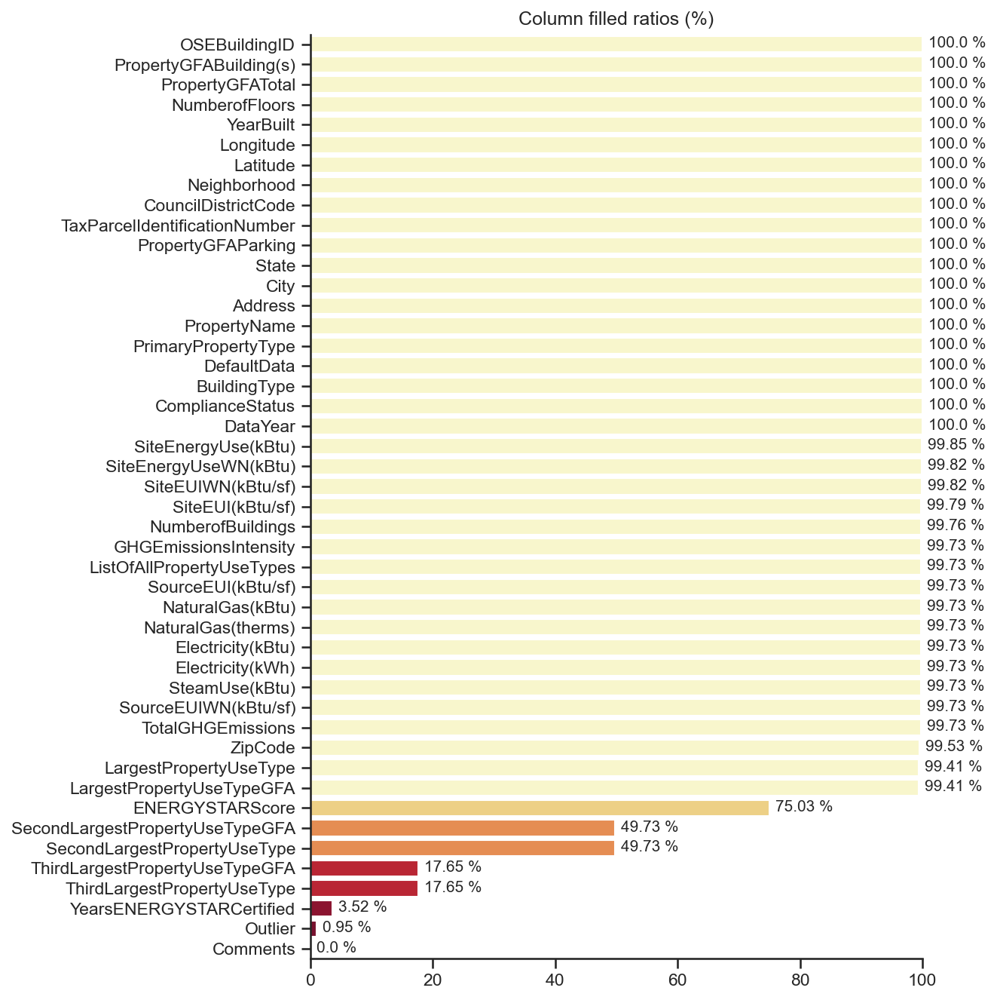

Wall time: 1.13 s


In [21]:
%%time

# Figure environement parameters.
fig = plt.figure(figsize=(9, 9), dpi=150)

# Generate the graphic.
sns_graphic_bar(cols_filled_ratio, x_threshold=1, y_threshold=-0.175, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')

plt.title('Column filled ratios (%)')
plt.xlabel(None)
plt.xlim(0,100)

plt.tight_layout()

plt.show()

# Export the figure.
fig.savefig(export_fig_path(fig, fig_title = '', fig_title_suffix=' Raw'))

## 3) Filter to stay in the frame of the project: Selection of the non-dwelling buidings

As the study is based on buildings not intended for housing, a fisrt filter should be applied to remove dwellings from the dataset.

=> The selection will be based on the "BuildingType" categories.

### a) Selection

In [22]:
# Check all the categories the "BuildingType" column contains.
data_raw['BuildingType'].unique()

array(['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)',
       'SPS-District K-12', 'Campus', 'Multifamily LR (1-4)',
       'Multifamily HR (10+)', 'Nonresidential WA'], dtype=object)

In [23]:
%%time

# Select all the non-residential houses and put them into a new df: "data_cleaned".
data_cleaned = data_raw[~data_raw['BuildingType'].str.contains('Multifamily')]

# Show.
data_cleaned['BuildingType'].unique()

Wall time: 3 ms


array(['NonResidential', 'Nonresidential COS', 'SPS-District K-12',
       'Campus', 'Nonresidential WA'], dtype=object)

In [24]:
# Check how many rows left after the filetring.

data_cleaned.shape

(1668, 46)

1668 rows left over 3376 on the raw dataset.<br>
=> 1668 / 3376 x 100 = 49.41 % of the rows left.

### b) New description

In [25]:
%%time

# Generate a df showing a basic description of the raw data.
dataset_description = dataset_basic_description(data_cleaned)[0]

# Display the results.
display(dataset_description)

,Raw Dataset Basic Description
Number of rows,1668.00
Number of columns,46.00
Number of cells,76728.00
Number of duplicated rows,0.00
Number of columns filled over 75.00 %,38.00
Ratio of filled columns over 75.00 % (%),82.61
Number of rows filled over 75.00 %,1666.00
Ratio of filled rows over 75.00 % (%),99.88
Number of filled cells,66948.00
Ratio of filled cells (%),87.25


Wall time: 48 ms


G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


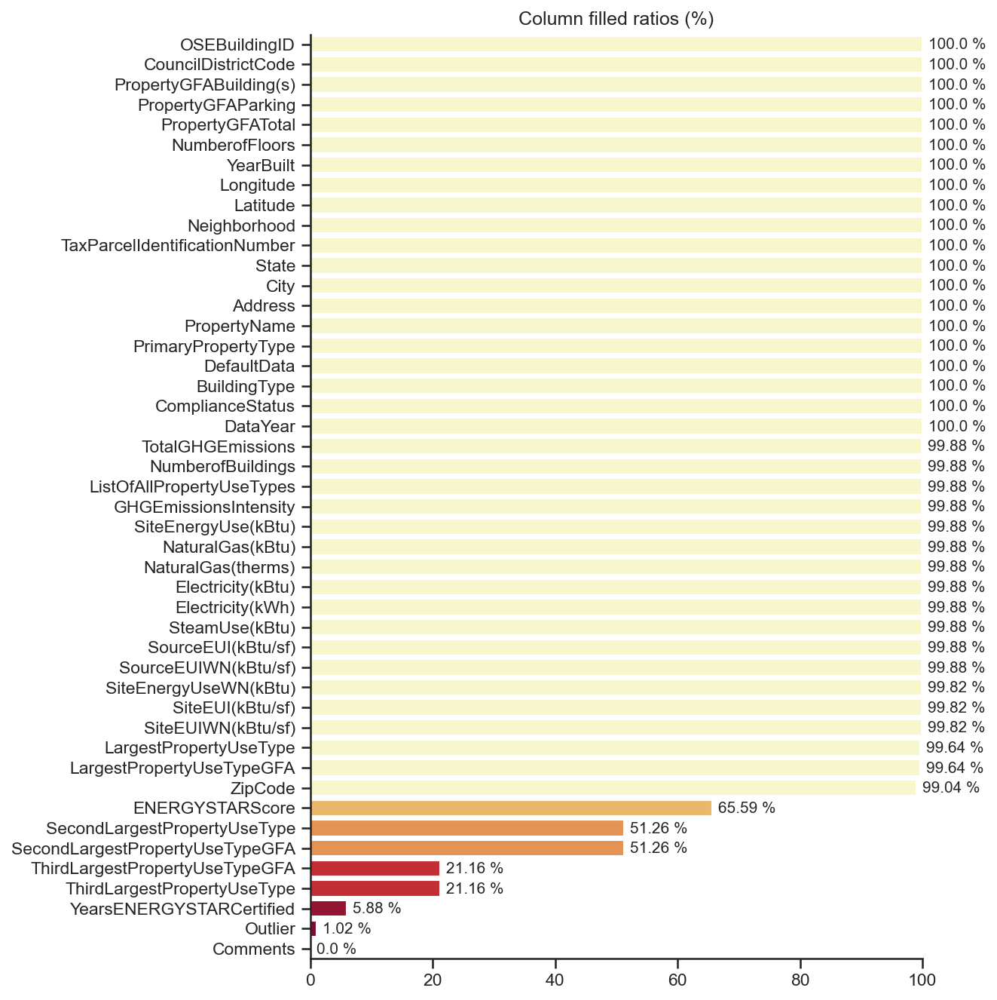

Wall time: 1.13 s


In [26]:
%%time

# Calculte the new column filled ratio.
cols_filled_ratio = data_filled_ratio(data_cleaned)[0]

# Figure environement parameters.
fig = plt.figure(figsize=(9, 9), dpi=150)

# Generate the graphic.
sns_graphic_bar(cols_filled_ratio, x_threshold=1, y_threshold=-0.25, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')

plt.title('Column filled ratios (%)')
plt.xlabel(None)
plt.xlim(0,100)

plt.tight_layout()

plt.show()

# Export the figure.
fig.savefig(export_fig_path(fig, fig_title = '', fig_title_suffix=' NonResidentialOnly'))

**- Figure redesigning for the defense**

G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
<timed exec>:15: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


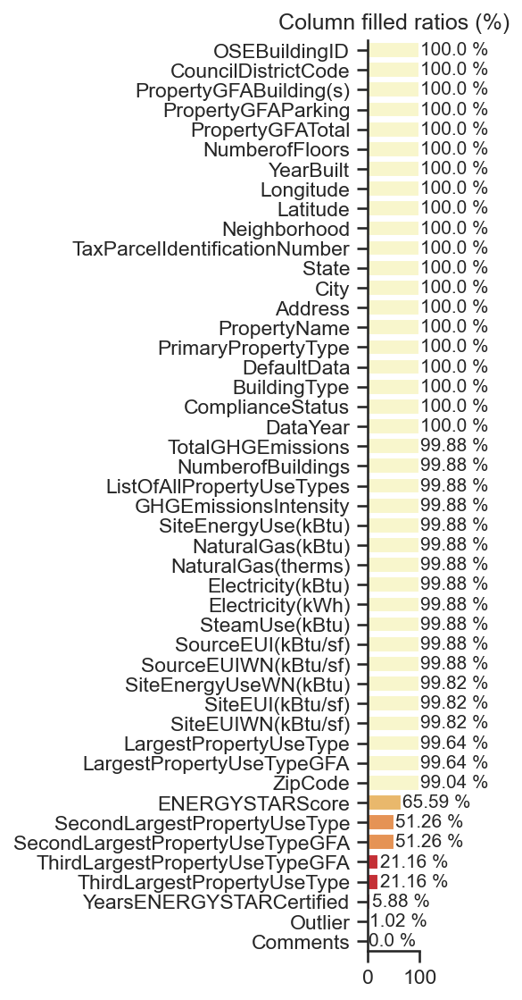

Wall time: 918 ms


In [27]:
%%time

# Calculte the new column filled ratio.
cols_filled_ratio = data_filled_ratio(data_cleaned)[0]

# Figure environement parameters.
fig = plt.figure(figsize=(0.5, 9), dpi=150)

# Generate the graphic.
sns_graphic_bar(cols_filled_ratio, x_threshold=2, y_threshold=-0.25, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')

plt.title('Column filled ratios (%)')
plt.xlabel(None)
plt.xlim(0,100)

plt.tight_layout()

plt.show()

# Export the figure.
fig.savefig(export_fig_path(fig, fig_title = '', fig_title_suffix=' NonResidentialOnly_Short'))

# III) Data cleaning & feature engineering

**Goals:**<br>
**1. Remove rows which might make models results wrong or won't be used by them.** <br>
**2. Reduce the dataset variables number as much as possible without loosing useful data for the study.**<br>
**3. Convert all string left categorical values to numeric ones in order to make them usable to train the coming predictive models.**

## 1) Removal of rows which are too empty

In [28]:
%%time

# Calculate.
rows_filled_ratio = data_filled_ratio(data_cleaned)[1]

# Show.
display_EZ(rows_filled_ratio)

,Ratio of Filled Cells by Rows (%)
371,95.652174
3199,95.652174
523,95.652174
273,95.652174
271,95.652174
...,...
3362,80.434783
2459,78.260870
353,78.260870
578,45.652174


Wall time: 8.01 ms


All rows are filled for at least 45 %.<br>
=> There is no fully empty row to drop.

## 2) Removal of columns with only one kind of value or no values
**Goal: Removal of useless columns having a unique value.**

In [29]:
# Show the raw dataset from the features having the least diversed data to the most one.
data_raw[data_raw.nunique().sort_values(ascending = True).index]

,Comments,DataYear,State,City,DefaultData,Outlier,ComplianceStatus,CouncilDistrictCode,BuildingType,NumberofBuildings,...,PropertyGFABuilding(s),PropertyGFATotal,TaxParcelIdentificationNumber,SiteEnergyUseWN(kBtu),Electricity(kBtu),Electricity(kWh),SiteEnergyUse(kBtu),Address,PropertyName,OSEBuildingID
0,NaN,2016,WA,Seattle,False,NaN,Compliant,7,NonResidential,1.0,...,88434,88434,0659000030,7.456910e+06,3.946027e+06,1.156514e+06,7.226362e+06,405 Olive way,Mayflower park hotel,1
1,NaN,2016,WA,Seattle,False,NaN,Compliant,7,NonResidential,1.0,...,88502,103566,0659000220,8.664479e+06,3.242851e+06,9.504252e+05,8.387933e+06,724 Pine street,Paramount Hotel,2
2,NaN,2016,WA,Seattle,False,NaN,Compliant,7,NonResidential,1.0,...,759392,956110,0659000475,7.393711e+07,4.952666e+07,1.451544e+07,7.258702e+07,1900 5th Avenue,5673-The Westin Seattle,3
3,NaN,2016,WA,Seattle,False,NaN,Compliant,7,NonResidential,1.0,...,61320,61320,0659000640,6.946800e+06,2.768924e+06,8.115253e+05,6.794584e+06,620 STEWART ST,HOTEL MAX,5
4,NaN,2016,WA,Seattle,False,NaN,Compliant,7,NonResidential,1.0,...,113580,175580,0659000970,1.465650e+07,5.368607e+06,1.573449e+06,1.417261e+07,401 LENORA ST,WARWICK SEATTLE HOTEL (ID8),8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,NaN,2016,WA,Seattle,True,NaN,Error - Correct Default Data,2,Nonresidential COS,1.0,...,12294,12294,1624049080,9.430032e+05,5.242709e+05,1.536550e+05,8.497457e+05,1600 S Dakota St,Horticulture building,50222
3372,NaN,2016,WA,Seattle,False,NaN,Compliant,2,Nonresidential COS,1.0,...,16000,16000,3558300000,1.053706e+06,3.965461e+05,1.162210e+05,9.502762e+05,719 8th Ave S,International district/Chinatown CC,50223
3373,NaN,2016,WA,Seattle,False,NaN,Compliant,7,Nonresidential COS,1.0,...,13157,13157,1794501150,6.053764e+06,1.792159e+06,5.252517e+05,5.765898e+06,1920 1st Ave W,Queen Anne Pool,50224
3374,NaN,2016,WA,Seattle,False,NaN,Compliant,1,Nonresidential COS,1.0,...,14101,14101,7883603155,7.828413e+05,3.488702e+05,1.022480e+05,7.194712e+05,8319 8th Ave S,South Park Community Center,50225


In [30]:
# Find the columns with 0 or few (<25) unique values.
show_uniques(data_cleaned, uniques_nb_limit = 25)

Column OSEBuildingID, 1668 unique values
Column PropertyName, 1664 unique values
Column Electricity(kBtu), 1655 unique values
Column Electricity(kWh), 1655 unique values
Column SiteEnergyUse(kBtu), 1651 unique values
Column Address, 1647 unique values
Column SiteEnergyUseWN(kBtu), 1640 unique values
Column TotalGHGEmissions, 1594 unique values
Column PropertyGFATotal, 1590 unique values
Column TaxParcelIdentificationNumber, 1587 unique values
Column PropertyGFABuilding(s), 1585 unique values
Column LargestPropertyUseTypeGFA, 1561 unique values
Column Latitude, 1497 unique values
Column Longitude, 1408 unique values
Column SourceEUIWN(kBtu/sf), 1308 unique values
Column SourceEUI(kBtu/sf), 1268 unique values
Column NaturalGas(therms), 1189 unique values
Column NaturalGas(kBtu), 1189 unique values
Column SiteEUIWN(kBtu/sf), 974 unique values
Column SiteEUI(kBtu/sf), 961 unique values
Column SecondLargestPropertyUseTypeGFA, 699 unique values
Column GHGEmissionsIntensity, 462 unique values

All consumption measurments were made in 2016, the city considered is Seattle only and is situated in one US state thus these variables won't bring any useful information for the predictve models.<br>
The "Comments" variables is completely empty and therefore also useless.<br>
=> Let's remove them from the dataset.

In [31]:
%%time

# Drop the four useless columns.
data_cleaned.drop(['DataYear', 'State', 'City', 'Comments'], axis=1, inplace=True)

# Check
display_EZ(data_cleaned, 5, None, None)

G:\0UserApps\Anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,NonResidential,Hotel,Mayflower park hotel,405 Olive way,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7.226362e+06,7.456910e+06,2003882.0,1.156514e+06,3.946027e+06,12764.529300,1.276453e+06,False,Compliant,NaN,249.98,2.83
1,2,NonResidential,Hotel,Paramount Hotel,724 Pine street,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8.387933e+06,8.664479e+06,0.0,9.504252e+05,3.242851e+06,51450.816410,5.145082e+06,False,Compliant,NaN,295.86,2.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3374,50225,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,NaN,7883603155,1,GREATER DUWAMISH,47.52832,-122.32431,1989,1.0,1,14101,0,14101,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,6601.0,Fitness Center/Health Club/Gym,6501.0,Pre-school/Daycare,484.0,NaN,NaN,51.000000,55.500000,105.300003,110.800003,7.194712e+05,7.828413e+05,0.0,1.022480e+05,3.488702e+05,3706.010010,3.706010e+05,False,Compliant,NaN,22.11,1.57
3375,50226,Nonresidential COS,Mixed Use Property,Van Asselt Community Center,2820 S Myrtle St,NaN,7857002030,2,GREATER DUWAMISH,47.53939,-122.29536,1938,1.0,1,18258,0,18258,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,8271.0,Fitness Center/Health Club/Gym,8000.0,Pre-school/Daycare,1108.0,NaN,NaN,63.099998,70.900002,115.800003,123.900001,1.152896e+06,1.293722e+06,0.0,1.267744e+05,4.325542e+05,7203.419922,7.203420e+05,False,Compliant,NaN,41.27,2.26


Wall time: 28 ms


G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


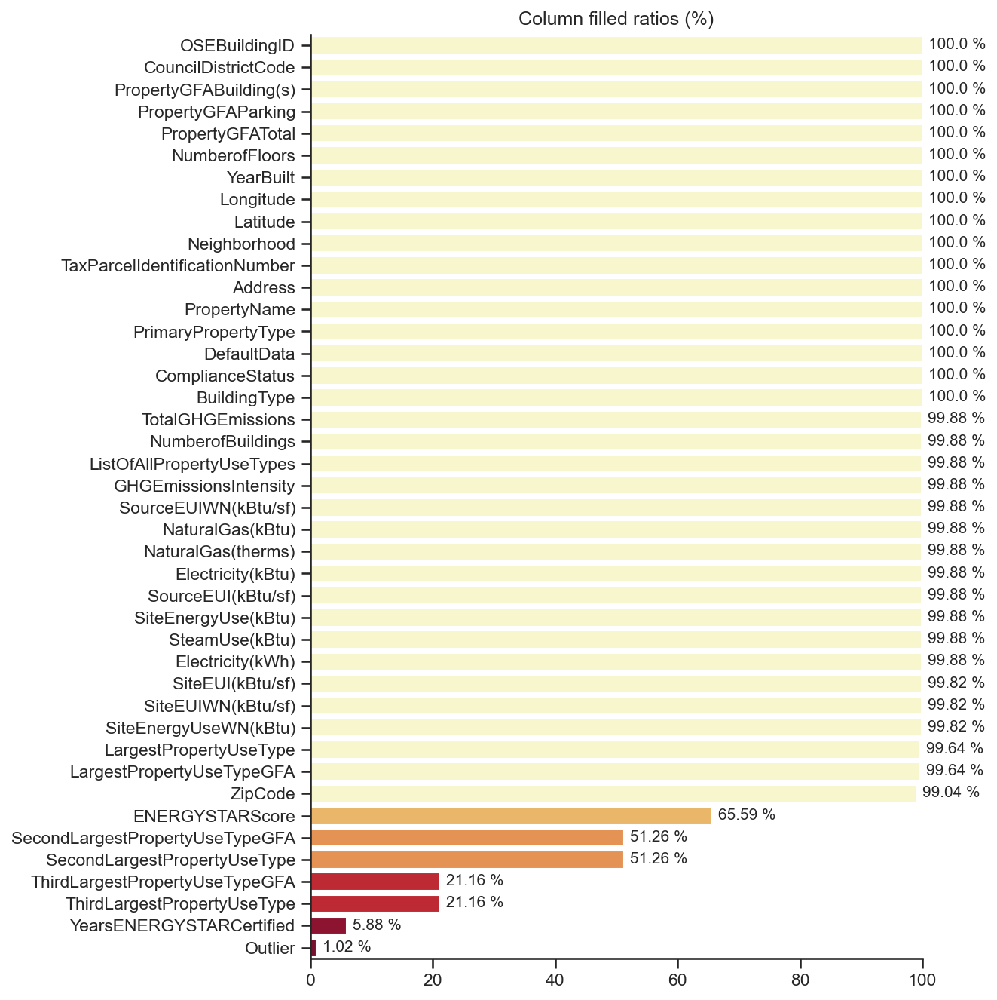

Wall time: 1.04 s


In [32]:
%%time

# Calculate.
cols_filled_ratio = data_filled_ratio(data_cleaned)[0]

# Figure environement parameters.
fig = plt.figure(figsize=(9, 9), dpi=150)

# Generate the graphic.
sns_graphic_bar(cols_filled_ratio, x_threshold=1, y_threshold=-0.175, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')

plt.title('Column filled ratios (%)')
plt.xlabel(None)
plt.xlim(0,100)

plt.tight_layout()

plt.show()

# Export the figure.
fig.savefig(export_fig_path(fig, fig_title = '', fig_title_suffix=' 01'))

## 3) Removal of the first outliers rows

It is noticeable that the column "Outliers" is pretty much empty.<br>
=> Let's have a look to this variable.

In [33]:
data_cleaned[data_cleaned['Outlier'].notna()]['Outlier']

226     High outlier
384      Low outlier
448      Low outlier
517     High outlier
839      Low outlier
1045     Low outlier
1229     Low outlier
1295     Low outlier
1611     Low outlier
1945     Low outlier
2129     Low outlier
2189     Low outlier
2216     Low outlier
2410     Low outlier
2450     Low outlier
2801     Low outlier
3152     Low outlier
Name: Outlier, dtype: object

There are only 2 possible values: "High outlier" and "Low outlier".<br>
=> At which other variables are they related to ?

In [34]:
check_energy = ['SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'Electricity(kBtu)', 'GHGEmissionsIntensity', 'Outlier']
data_cleaned[data_cleaned['Outlier'].notna()][check_energy]

,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),Electricity(kBtu),GHGEmissionsIntensity,Outlier
226,297.399994,909.599976,39794668.0,2.10,High outlier
384,4.600000,14.300000,318963.0,0.03,Low outlier
448,58.000000,28.000000,1608768.0,0.19,Low outlier
517,311.700012,978.900024,27137187.0,1.46,High outlier
839,12.100000,27.000000,246628.0,0.32,Low outlier
1045,3.600000,6.400000,49005.0,0.14,Low outlier
1229,1.000000,3.000000,24105.0,0.00,Low outlier
1295,1.800000,5.800000,44294.0,0.01,Low outlier
1611,4.200000,13.300000,100842.0,0.03,Low outlier
1945,6.300000,13.200000,141784.0,0.19,Low outlier


In [35]:
check_energy_db = data_cleaned[data_cleaned['Outlier'].notna()][check_energy].describe()
check_energy_db

,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),Electricity(kBtu),GHGEmissionsIntensity
count,17.000000,17.000000,1.700000e+01,17.000000
mean,44.005883,125.488235,4.144371e+06,0.301765
std,99.015230,308.745939,1.126707e+07,0.575904
min,0.700000,2.100000,1.137000e+04,0.000000
25%,3.400000,5.800000,4.900500e+04,0.030000
50%,5.200000,14.300000,1.176800e+05,0.140000
75%,12.100000,27.000000,3.189630e+05,0.190000
max,311.700012,978.900024,3.979467e+07,2.100000


It is noticeable that high and low outlier correspond to high or low energy or gas emission values respectively.<br>
=> So we could trust this variable to suppose their corresponding rows as outliers and remove them.

In [36]:
%%time

# Removal of all ouliers rows
data_cleaned = data_cleaned[data_cleaned['Outlier'].isnull()]

# Check
data_cleaned['Outlier'].unique()

Wall time: 1 ms


array([nan], dtype=object)

Now it is done the outlier variable contains only empty rows.<br>
=> It became useless and then can be removed.

In [37]:
%%time

# Removal of the outlier variable.
data_cleaned = data_cleaned.drop(['Outlier'], axis=1)
data_cleaned.shape

Wall time: 1 ms


(1651, 41)

## 4) Removal of redundant variables

**Goal: Selection of only one variable to represent a type of data.**

##### - Variables related to the energy consumption of buildings

- *SiteEUI(kBtu/sf) / SiteEUIWN(kBtu/sf) :* Site Energy Use Intensity (EUI) is a property's Site Energy Use divided by its gross floor area. Site Energy Use is the annual amount of all the energy consumed by the property on-site.<br>
- *SourceEUI(kBtu/sf) / SourceEUIWN(kBtu/sf):* Source Energy Use Intensity (EUI) is a property's Source Energy Use divided by its gross floor area. Source Energy Use is the annual energy used to operate the property, including losses from generation, transmission, & distribution.
- *Weather normalized (WN suffix)*: WN suffixes mean that the value is an estimation over 30-year at average weather conditions of the given consumption.<br>
=> Variables WN suffixed shall be removed as they act as less precised duplicates compared to their non-suffixed couterparts.
- There are 2 types of energy representation. One related to the surface of the building and the other one related to the energy total consumption of this form of energy by the building over a year.
- *SiteEnergyUse(kBtu), SiteEnergyUseWN(kBtu), SteamUse(kBtu), Electricity(kWh), Electricity(kBtu), NaturalGas(therms), NaturalGas(kBtu):* Use of different energy units.<br>
=> All units shall be homogenized to one. It is noticeable that the two variables expressed in another unit than kBtu are also expressed in this one. Thus, they are redundant and can be removed from the dataset.<br>
*NB: Electricity(kWh), Electricity(kBtu), NaturalGas(therms) and NaturalGas(kBtu) are all filled at 99.73 %, so we can suppose that it won't be useful or possible to try to imput a column by another.*


*NB: "Le British thermal unit (abrégé en Btu ou BTU) est une unité anglo-saxonne d'énergie définie par la quantité de chaleur nécessaire pour élever la température d'une livre anglaise d'eau d'un degré °F à la pression constante d'une atmosphère." (Source: https://fr.wikipedia.org/wiki/British_thermal_unit)*

### a) Check if imputations are possible

#### i. Between WN suffixed and not suffixed features

In [38]:
## %%time

redudant_energy_variables = ['SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
                             'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)']

data_cleaned[(data_cleaned['SiteEUI(kBtu/sf)'].isna()) | (data_cleaned['SiteEUIWN(kBtu/sf)'].isna()) |
             (data_cleaned['SourceEUI(kBtu/sf)'].isna()) | (data_cleaned['SourceEUIWN(kBtu/sf)'].isna()) |
             (data_cleaned['SiteEnergyUse(kBtu)'].isna()) | (data_cleaned['SiteEnergyUseWN(kBtu)'].isna()) |
             (data_cleaned['TotalGHGEmissions'].isna()) | (data_cleaned['GHGEmissionsIntensity'].isna())][['PropertyName'] + redudant_energy_variables]#.iloc[2:4]

,PropertyName,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf)
304,Washington State Convention Center,0.0,0.0,0.00,0.00,NaN,0.0,0.0,0.0
563,Market Place I & II-2003 Western Avenue,5177270.5,NaN,109.16,0.83,39.5,NaN,128.0,0.0
578,SEATTLE BUILDING,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2670,KALBERG BUILDING,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
data_cleaned[(data_cleaned['SiteEUI(kBtu/sf)'] == 0) | (data_cleaned['SiteEUIWN(kBtu/sf)'] == 0) |
             (data_cleaned['SourceEUI(kBtu/sf)'] == 0) | (data_cleaned['SourceEUIWN(kBtu/sf)'] == 0) |
             (data_cleaned['SiteEnergyUse(kBtu)'] == 0) | (data_cleaned['SiteEnergyUseWN(kBtu)'] == 0)][['PropertyName'] + redudant_energy_variables]

,PropertyName,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf)
28,Meany Building,0.000000e+00,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.0
31,John Hay Elementary,0.000000e+00,0.0,10.43,0.20,0.000000,0.000000,0.000000,0.0
62,Arbor Heights Elementary,0.000000e+00,0.0,4.19,0.08,0.000000,0.000000,0.000000,0.0
81,Pathfinder K-8,0.000000e+00,0.0,11.84,0.16,0.000000,0.000000,0.000000,0.0
85,John Muir Elementary,0.000000e+00,0.0,16.36,0.28,0.000000,0.000000,0.000000,0.0
95,B.F. Day Elementary,0.000000e+00,0.0,14.67,0.22,0.000000,0.000000,0.000000,0.0
133,Whitman Middle,0.000000e+00,0.0,229.38,1.43,0.000000,0.000000,0.000000,0.0
139,Washington Middle,0.000000e+00,0.0,170.90,1.25,0.000000,0.000000,0.000000,0.0
152,Olympic View Elementary,0.000000e+00,0.0,0.00,0.00,0.000000,0.000000,0.000000,0.0
220,Norton Building,2.490613e+07,0.0,940.47,2.48,105.199997,0.000000,240.899994,0.0


Finally, outliers or missing data are within variables with the suffix "WN" in there names.<br>
=> Variables with the suffix "WN" cannot be used for imputation into their non-suffixed counterparts and they will be removed since they are redundant.<br>

#### ii. Check if some outliers can be detected.

##### - Electricity and NaturalGas

In [40]:
%%time

# Calculated the coefficients of proportionnality if there are.
linear_coeff = data_cleaned[['PropertyName', 'Electricity(kWh)', 'Electricity(kBtu)',
                             'NaturalGas(therms)', 'NaturalGas(kBtu)']]
linear_coeff['Elec_Coeffs'] = data_cleaned['Electricity(kBtu)'] / data_cleaned['Electricity(kWh)']
linear_coeff['NatGas_Coeffs'] = data_cleaned['NaturalGas(kBtu)'] / data_cleaned['NaturalGas(therms)']

linear_coeff_db = linear_coeff[['Elec_Coeffs', 'NatGas_Coeffs']].describe()
linear_coeff_db

Wall time: 7.01 ms


<timed exec>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
<timed exec>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,Elec_Coeffs,NatGas_Coeffs
count,1638.000000,1182.000000
mean,3.411749,100.000014
std,0.010180,0.000830
min,3.000000,99.987152
25%,3.412000,99.999996
50%,3.412000,100.000000
75%,3.412000,100.000004
max,3.412085,100.019019


For the "Electricity variable" a coeff of 3.412 appears clearly between the 2 columns and for Naturalgas it is a coeff of 100.<br>
The differences between the max and min values while the standard deviation remains low, tends to show that there is no significant outliers.<br>
=> Let's try to highlight them.

In [41]:
# Operation done: coeff +/- std.

Elec_outliers = linear_coeff[(linear_coeff['Elec_Coeffs'] > linear_coeff_db.iloc[5,0] + linear_coeff_db.iloc[2,0]) |(linear_coeff['Elec_Coeffs'] < linear_coeff_db.iloc[5,0] - linear_coeff_db.iloc[2,0])][['PropertyName', 'Electricity(kWh)', 'Electricity(kBtu)', 'Elec_Coeffs']]
Elec_outliers

,PropertyName,Electricity(kWh),Electricity(kBtu),Elec_Coeffs
1670,Evergreen Washelli,1.0,3.0,3.0


In [42]:
Elec_coeff_idx = list(Elec_outliers.index)
Elec_coeff_idx

[1670]

In [43]:
NatGas_outliers = linear_coeff[(linear_coeff['NatGas_Coeffs'] > linear_coeff_db.iloc[5,1] + linear_coeff_db.iloc[2,1]) |
                               (linear_coeff['NatGas_Coeffs'] < linear_coeff_db.iloc[5,1] - linear_coeff_db.iloc[2,1])][['PropertyName', 'NaturalGas(therms)', 'NaturalGas(kBtu)', 'NatGas_Coeffs']]
NatGas_outliers

,PropertyName,NaturalGas(therms),NaturalGas(kBtu),NatGas_Coeffs
302,(71367A) SEATTLE Macy's,17.526667,1753.0,100.019019
316,Frye Distribution Center,7.638800,764.0,100.015707
681,(ID19565) Nelson Trucking,7.080910,708.0,99.987152
859,Lisa Li Building,309.535156,30954.0,100.001565
3014,900 E Pine St,31.421900,3142.0,99.993954


In [44]:
NatGas_coeff_idx = list(NatGas_outliers.index)
NatGas_coeff_idx

[302, 316, 681, 859, 3014]

In [45]:
display_EZ(data_cleaned.loc[Elec_coeff_idx + NatGas_coeff_idx], None, None, None)

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
1670,23064,NonResidential,Other,Evergreen Washelli,11111 Aurora Ave. N,98133.0,3026049008,5,NORTHWEST,47.70969,-122.34557,1970,5.0,1,23166,0,23166,Other,Other,23166.0,NaN,NaN,NaN,NaN,NaN,NaN,150.000000,157.500000,157.500000,165.399994,3.475804e+06,3.648466e+06,0.00,1.000000e+00,3.0,34758.007810,3475801.0,False,Compliant,184.60,7.97
302,433,NonResidential,Retail Store,(71367A) SEATTLE Macy's,300 PINE STREET,98181.0,1977201320,7,DOWNTOWN,47.61098,-122.33815,1929,1.0,8,861702,0,861702,"Other, Retail Store",Retail Store,509342.0,Other,380639.0,NaN,NaN,NaN,NaN,19.900000,19.900000,56.000000,56.000000,1.766665e+07,1.766665e+07,2927935.25,4.319154e+06,14736955.0,17.526667,1753.0,False,Compliant,328.83,0.38
316,451,NonResidential,Distribution Center,Frye Distribution Center,660 S. Othello St.,98108.0,2136200695,2,GREATER DUWAMISH,47.53764,-122.32320,1960,1.0,1,119661,0,119661,Distribution Center,Distribution Center,118733.0,NaN,NaN,NaN,NaN,NaN,97.0,6.500000,6.500000,20.500000,20.500000,7.757292e+05,7.758642e+05,0.00,2.271293e+05,774965.0,7.638800,764.0,False,Compliant,5.44,0.05
681,19565,NonResidential,Warehouse,(ID19565) Nelson Trucking,9747 M L KING JR WAY S,98118.0,0323049146,2,GREATER DUWAMISH,47.51399,-122.27946,1979,1.0,1,26380,0,26380,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,23620.0,Office,2760.0,NaN,NaN,NaN,NaN,19.299999,20.000000,60.500000,62.700001,5.091240e+05,5.269553e+05,0.00,1.490082e+05,508416.0,7.080910,708.0,False,Compliant,3.58,0.14
859,20033,NonResidential,Small- and Mid-Sized Office,Lisa Li Building,4907 25th Ave NE,98105.0,0925049118,4,NORTHEAST,47.66461,-122.30142,1989,1.0,2,20384,0,20384,Office,Office,25021.0,NaN,NaN,NaN,NaN,NaN,16.0,71.599998,71.199997,222.199997,220.500000,1.791071e+06,1.781798e+06,0.00,5.158610e+05,1760118.0,309.535156,30954.0,False,Compliant,13.91,0.68
3014,27882,NonResidential,Small- and Mid-Sized Office,900 E Pine St,900 E Pine St,98122.0,6003000605,3,EAST,47.61556,-122.32048,1925,1.0,2,27938,0,27938,"Office, Retail Store",Office,13917.0,Retail Store,13188.0,NaN,NaN,NaN,97.0,37.900002,37.000000,118.800003,115.900001,1.027394e+06,1.002986e+06,0.00,3.001911e+05,1024252.0,31.421900,3142.0,False,Compliant,7.31,0.26


Variations are too small to remove these rows.

In [46]:
%%time

# Removal of the outliers.
#data_cleaned.drop(Elec_coeff_idx + NatGas_coeff_idx, axis=0, inplace=True)

Wall time: 0 ns


##### - Total GHG Emissions

In [47]:
df = data_cleaned[['PropertyGFATotal', 'TotalGHGEmissions', 'GHGEmissionsIntensity']]
df['GHGEmissionsIntensity_Calculated'] = round(df['TotalGHGEmissions'] / df['PropertyGFATotal'] * 1000, 2)
df['GHGEmissionsIntensity_Coeff'] = df['GHGEmissionsIntensity'] / df['GHGEmissionsIntensity_Calculated']
df

<ipython-input-47-2cea7de7277d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['GHGEmissionsIntensity_Calculated'] = round(df['TotalGHGEmissions'] / df['PropertyGFATotal'] * 1000, 2)
<ipython-input-47-2cea7de7277d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['GHGEmissionsIntensity_Coeff'] = df['GHGEmissionsIntensity'] / df['GHGEmissionsIntensity_Calculated']


,PropertyGFATotal,TotalGHGEmissions,GHGEmissionsIntensity,GHGEmissionsIntensity_Calculated,GHGEmissionsIntensity_Coeff
0,88434,249.98,2.83,2.83,1.0
1,103566,295.86,2.86,2.86,1.0
2,956110,2089.28,2.19,2.19,1.0
3,61320,286.43,4.67,4.67,1.0
4,175580,505.01,2.88,2.88,1.0
...,...,...,...,...,...
3371,12294,20.94,1.70,1.70,1.0
3372,16000,32.17,2.01,2.01,1.0
3373,13157,223.54,16.99,16.99,1.0
3374,14101,22.11,1.57,1.57,1.0


In [48]:
df[['GHGEmissionsIntensity_Coeff']].describe()

,GHGEmissionsIntensity_Coeff
count,1643.0
mean,1.0
std,0.0
min,1.0
25%,1.0
50%,1.0
75%,1.0
max,1.0


A mean of 1.0 and a standard deviation of 0.0 shows that there is no unexpected values.<br>
=> No outliers are detected by using the other feature.

#### iii. Check if some NaN could be imputed

In [49]:
len(unmatching_rows(data_cleaned, 'Electricity(kWh)', 'Electricity(kBtu)', np.nan))

0

In [50]:
len(unmatching_rows(data_cleaned, 'NaturalGas(therms)', 'NaturalGas(kBtu)', np.nan))

0

No line can be imputed for "Electricity" and "NaturalGas".

#### iv. Removal of the redudant columns

In [51]:
%%time

# Removal of variables with the WN suffix.
data_cleaned = data_cleaned.drop(search_cols_with_str(data_cleaned, string='WN'), axis=1)

Wall time: 1 ms


In [52]:
%%time

# Removal of the redundant variables based on different units.
data_cleaned.drop(['NaturalGas(therms)', 'Electricity(kWh)'], axis=1, inplace=True)

Wall time: 1 ms


In [53]:
# Check
display_EZ(data_cleaned, 5, None, None)

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
0,1,NonResidential,Hotel,Mayflower park hotel,405 Olive way,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,182.500000,7.226362e+06,2003882.0,3.946027e+06,1.276453e+06,False,Compliant,249.98,2.83
1,2,NonResidential,Hotel,Paramount Hotel,724 Pine street,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,176.100006,8.387933e+06,0.0,3.242851e+06,5.145082e+06,False,Compliant,295.86,2.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3374,50225,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,NaN,7883603155,1,GREATER DUWAMISH,47.52832,-122.32431,1989,1.0,1,14101,0,14101,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,6601.0,Fitness Center/Health Club/Gym,6501.0,Pre-school/Daycare,484.0,NaN,NaN,51.000000,105.300003,7.194712e+05,0.0,3.488702e+05,3.706010e+05,False,Compliant,22.11,1.57
3375,50226,Nonresidential COS,Mixed Use Property,Van Asselt Community Center,2820 S Myrtle St,NaN,7857002030,2,GREATER DUWAMISH,47.53939,-122.29536,1938,1.0,1,18258,0,18258,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,8271.0,Fitness Center/Health Club/Gym,8000.0,Pre-school/Daycare,1108.0,NaN,NaN,63.099998,115.800003,1.152896e+06,0.0,4.325542e+05,7.203420e+05,False,Compliant,41.27,2.26


## 5) Aberrant or particularly uncommon values

In [54]:
data_cleaned.min()

OSEBuildingID                                        1
BuildingType                                    Campus
PrimaryPropertyType                Distribution Center
PropertyName                          #4706 Bitterlake
Address                                10 Harrison St.
ZipCode                                          98006
TaxParcelIdentificationNumber               0001800033
CouncilDistrictCode                                  1
Neighborhood                                   BALLARD
Latitude                                       47.4992
Longitude                                     -122.412
YearBuilt                                         1900
NumberofBuildings                                    0
NumberofFloors                                       0
PropertyGFATotal                                 11285
PropertyGFAParking                                   0
PropertyGFABuilding(s)                            3636
LargestPropertyUseTypeGFA                         5656
SecondLarg

### a) Check negative outliers

#### i. Energy consumption and gas emissions

"SiteEnergyUse(kBtu)", "TotalGHGEmissions" and "GHGEmissionsIntensity" have negative values.<br>
=> Let's have a look of the corresponding rows.

In [55]:
#['SiteEnergyUse(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity']
display_EZ(data_cleaned[data_cleaned['SiteEnergyUse(kBtu)'] < 0])

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity


In [56]:
display_EZ(data_cleaned[data_cleaned['TotalGHGEmissions'] < 0])

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
3206,49784,NonResidential,Small- and Mid-Sized Office,Bullitt Center,1501 E. Madison St.,98122.0,7234600195,3,CENTRAL,47.61432,-122.31257,2013,1.0,6,52000,0,52000,Office,Office,48159.0,NaN,NaN,NaN,NaN,NaN,100.0,7.1,2.0,342726.0938,0.0,-115417.0,0.0,False,Compliant,-0.8,-0.02


In [57]:
display_EZ(data_cleaned[data_cleaned['GHGEmissionsIntensity'] < 0])

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
3206,49784,NonResidential,Small- and Mid-Sized Office,Bullitt Center,1501 E. Madison St.,98122.0,7234600195,3,CENTRAL,47.61432,-122.31257,2013,1.0,6,52000,0,52000,Office,Office,48159.0,NaN,NaN,NaN,NaN,NaN,100.0,7.1,2.0,342726.0938,0.0,-115417.0,0.0,False,Compliant,-0.8,-0.02


It shows that these special values are coming from the same row.<br>
After further check, it appears that this row correspond to the "Bullit Center" of Seattle which is claimed to be the "THE GREENEST COMMERCIAL BUILDING IN THE WORLD" (Source: https://bullittcenter.org) and is able to be self sufficient in energy and even produce more electricity than it requires to work (Source: https://en.wikipedia.org/wiki/Bullitt_Center). Nevertheless, even if it produces more electricity than it consumes, its total energy consumption is 2.5 times more important. <br>
=> Thus, negative values could mean here that the building produces or absorb more of the energy or gas respectively than it consumes over the year.

### b) Check null outliers

#### i. Energy consumption and gas emissions

"SiteEnergyUse(kBtu)", "TotalGHGEmissions" and "GHGEmissionsIntensity" have null values.<br>
=> Let's have a look of the corresponding rows and check if these values as to be considered as NaN or are justified ?

In [58]:
display_EZ(data_cleaned[data_cleaned['SiteEnergyUse(kBtu)'] == 0][['PropertyName', 'PrimaryPropertyType', 'SiteEnergyUse(kBtu)']])

,PropertyName,PrimaryPropertyType,SiteEnergyUse(kBtu)
28,Meany Building,K-12 School,0.0
31,John Hay Elementary,K-12 School,0.0
62,Arbor Heights Elementary,K-12 School,0.0
81,Pathfinder K-8,K-12 School,0.0
85,John Muir Elementary,K-12 School,0.0
95,B.F. Day Elementary,K-12 School,0.0
133,Whitman Middle,K-12 School,0.0
139,Washington Middle,K-12 School,0.0
152,Olympic View Elementary,K-12 School,0.0
304,Washington State Convention Center,Other,0.0


After some short google researches, I did not find anything justifying that "Welcome Home Society - PriceCo" and "Washington State Convention Center" would not be counted as energy consumers.<br>
=> Let's have a look at their gas emissions to decide how to manage them.<br><br>
Most of the buildings notified as not energy at allare K-12 school type properties.<br>
=> Are all K-12 school types considered as not consuming energy ?

In [59]:
display_EZ(data_cleaned[data_cleaned['PrimaryPropertyType'] == 'K-12 School'][['PropertyName', 'PrimaryPropertyType', 'SiteEnergyUse(kBtu)']])

,PropertyName,PrimaryPropertyType,SiteEnergyUse(kBtu)
22,Graham Hill Elementary,K-12 School,1539478.500
28,Meany Building,K-12 School,0.000
30,Jane Addams Middle,K-12 School,6779173.000
31,John Hay Elementary,K-12 School,0.000
37,Lawton Elementary,K-12 School,1650279.250
...,...,...,...
3126,South Shore K-8,K-12 School,4959298.000
3166,Catharine Blaine K-8,K-12 School,0.000
3214,The Northwest School 401,K-12 School,2912264.000
3230,Paul G Allen Athletic Center,K-12 School,1662054.125


As it can be observed, K-12 School properties which are considered as not consuming any energy are minoritary and, in front of this evidences, do not make sense.<br>
=> They will be considered as NaN let's check if they are also considered as gas emissive free ?

In [60]:
display_EZ(data_cleaned[data_cleaned['SiteEnergyUse(kBtu)'] == 0][['PropertyName', 'PrimaryPropertyType', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']])

,PropertyName,PrimaryPropertyType,SiteEnergyUse(kBtu),TotalGHGEmissions
28,Meany Building,K-12 School,0.0,0.00
31,John Hay Elementary,K-12 School,0.0,10.43
62,Arbor Heights Elementary,K-12 School,0.0,4.19
81,Pathfinder K-8,K-12 School,0.0,11.84
85,John Muir Elementary,K-12 School,0.0,16.36
95,B.F. Day Elementary,K-12 School,0.0,14.67
133,Whitman Middle,K-12 School,0.0,229.38
139,Washington Middle,K-12 School,0.0,170.90
152,Olympic View Elementary,K-12 School,0.0,0.00
304,Washington State Convention Center,Other,0.0,0.00


Some are also gas emittive free but not most of them. After, thinking all these propertis will be removed instead of keeping the ones which emit gas by replacing their energy consumption of 0 by an average of all K-12 school energy consumption. They are 137 K-12 school properties so removing a dozen seems to me better for the models training.<br><br>
In addition, "Welcome Home Society - PriceCo" and "Washington State Convention Center" are also gas emittive free. <br><br>
=> All these properties will be removed.

In [61]:
# Drop the properties.
data_cleaned = data_cleaned.drop(data_cleaned[data_cleaned['SiteEnergyUse(kBtu)'] == 0].index)

# Check the results.
print("Null values left:", len(data_cleaned[data_cleaned['SiteEnergyUse(kBtu)'] == 0].index))

Null values left: 0


Let's check if there some left properties which shows a "TotalGHGEmissions" of 0. 

In [62]:
display_EZ(data_cleaned[data_cleaned['TotalGHGEmissions'] == 0][['PropertyName', 'PrimaryPropertyType', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity']])

,PropertyName,PrimaryPropertyType,SiteEnergyUse(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
513,IUC- Whole Foods Interbay,Supermarket / Grocery Store,12525174.0,0.0,0.0


Let's check if other properties of the same type are considered the same way.

In [63]:
display_EZ(data_cleaned[data_cleaned['PrimaryPropertyType'] == 'Supermarket / Grocery Store'][['PropertyName', 'PrimaryPropertyType', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity']])

,PropertyName,PrimaryPropertyType,SiteEnergyUse(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
254,70500872 -- Holman Road,Supermarket / Grocery Store,1.429397e+07,384.27,6.31
356,70100179-Lake City,Supermarket / Grocery Store,1.451279e+07,277.98,0.90
357,RESTAURANT DEPOT SEATTLE (ID503),Supermarket / Grocery Store,6.522552e+06,45.47,0.72
365,Sam's Club #18-6687,Supermarket / Grocery Store,1.342408e+07,237.39,1.64
367,00410-Hwy 99 & 130th,Supermarket / Grocery Store,8.663691e+06,158.92,3.17
401,Safeway 1845 - Greenwood Ave,Supermarket / Grocery Store,1.471526e+07,414.43,7.12
402,70500858 -- North Seattle,Supermarket / Grocery Store,1.105454e+07,272.54,4.66
447,Safeway 1965 - Rainier Ave,Supermarket / Grocery Store,1.313322e+07,306.50,5.02
513,IUC- Whole Foods Interbay,Supermarket / Grocery Store,1.252517e+07,0.00,0.00
542,70100122-Greenwood,Supermarket / Grocery Store,1.686598e+07,293.56,2.07


Then for the same reasons as discussed for the K-12 School properties this property will simply be removed.

In [64]:
# Drop the properties.
data_cleaned = data_cleaned.drop(data_cleaned[data_cleaned['TotalGHGEmissions'] == 0].index)

# Check the results.
print("Null values left:", len(data_cleaned[data_cleaned['TotalGHGEmissions'] == 0].index))

Null values left: 0


#### ii. No buildings in a property

In [65]:
%%time

# Check buildings having 0 building...
display_EZ(data_cleaned[data_cleaned['NumberofBuildings'] <= 0][['PropertyName', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFAParking']])

,PropertyName,NumberofBuildings,NumberofFloors,PropertyGFAParking
63,Polyclinic North && South,0.0,3,0
76,KCTS9,0.0,2,2352
160,Harbor Island: Warehouse E - DNRP-SWD,0.0,4,0
201,Cox Media Group Seattle KIRO TV (322),0.0,3,26731
241,University District Office Buiding,0.0,5,0
264,Thaw Building,0.0,1,0
278,Fourth and Pike Building,0.0,10,0
280,Motif Seattle,0.0,19,59280
291,Meridian (East),0.0,4,166960
358,Westbridge,0.0,1,0


Wall time: 10 ms


These areas are shown as having no building but after a quick google search it appears that they are actually closed interior areas.<br>
*NB: I can't say if carparks are considered as a building or not but it does not matter here.*<br>
=> These values seem aberrants.

In [66]:
%%time

data_cleaned['NumberofBuildings'].value_counts()

Wall time: 1 ms


1.0      1528
0.0        52
2.0        14
3.0        12
5.0         7
6.0         4
4.0         4
8.0         2
14.0        2
111.0       1
10.0        1
23.0        1
7.0         1
9.0         1
11.0        1
27.0        1
Name: NumberofBuildings, dtype: int64

G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


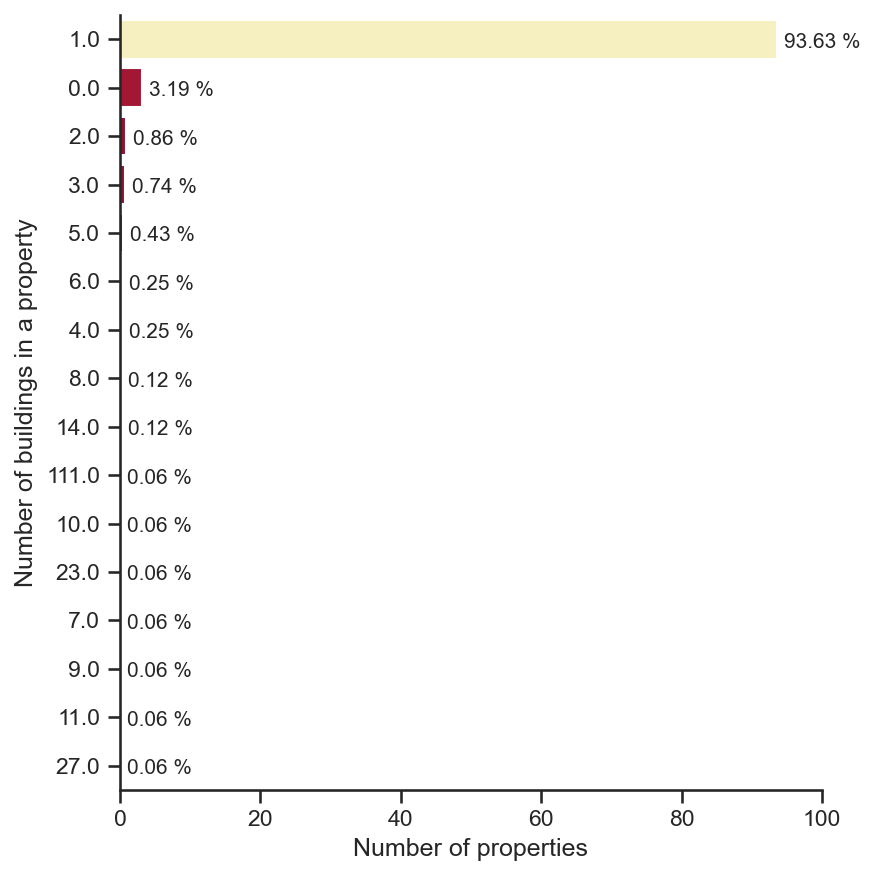

Wall time: 323 ms


In [67]:
%%time

# Dataframe or serie to plot.
df = pd.DataFrame(data_cleaned['NumberofBuildings'].value_counts() / data_cleaned['NumberofBuildings'].value_counts().sum() * 100)

# Figure environement parameters.
fig = plt.figure(figsize=(6, 6), dpi=150)

# Generate the graphic.
sns_graphic_bar(df, x_threshold=1, y_threshold=-0.175, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')#, pal="b"

# Set graphic parameters.
plt.title('')
plt.xlabel('Number of properties')
plt.ylabel('Number of buildings in a property')
plt.xlim(0,100)
plt.tight_layout()

# Show the graph.
plt.show()

# Export the figure.
fig.savefig(export_fig_path(fig, fig_title = '', fig_title_suffix=' NumberOfBuildings_BarPlot'))

Almost all areas contain only one building.<br>
=> Area showing no building will be set to 1 which is very close to the physically possible average.<br>

In [68]:
%%time

# Set the 0 value to 1.
data_cleaned['NumberofBuildings'].replace(0, 1, inplace=True)

# Show.
print('There is %i building with no floor anymore.' % len(data_cleaned[data_cleaned['NumberofBuildings'] <= 0]))

There is 0 building with no floor anymore.
Wall time: 1 ms


#### iii. No floor in a building

In [69]:
%%time

# Check buildings having 0 floor...
display_EZ(data_cleaned[data_cleaned['NumberofFloors'] <= 0][['PropertyName', 'NumberofFloors', 'NumberofBuildings']])

,PropertyName,NumberofFloors,NumberofBuildings
166,Grand Hyatt Seattle,0,1.0
487,Arnold Pavilion,0,1.0
488,2200 Westlake - SEDO,0,1.0
564,Pacific Place,0,1.0
1754,HART First Hill LLC,0,1.0
1993,(ID#24086)Campus1:KC Metro Transit Atlantic Central Bases,0,10.0
3130,Sandpoint #5,0,1.0
3131,Sandpoint #25,0,1.0
3132,Sandpoint #29,0,1.0
3168,Magnuson,0,8.0


Wall time: 6.01 ms


In [70]:
%%time

data_cleaned['NumberofFloors'].value_counts()

Wall time: 1 ms


1     453
2     382
3     261
4     145
5     102
6      82
7      33
8      22
11     18
10     18
0      16
14      9
12      9
9       8
13      7
15      6
42      5
19      5
17      4
21      3
16      3
18      3
20      3
22      3
24      3
25      3
29      3
33      3
23      3
36      2
34      2
41      2
46      1
63      1
56      1
55      1
49      1
47      1
76      1
39      1
37      1
30      1
28      1
27      1
99      1
Name: NumberofFloors, dtype: int64

G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


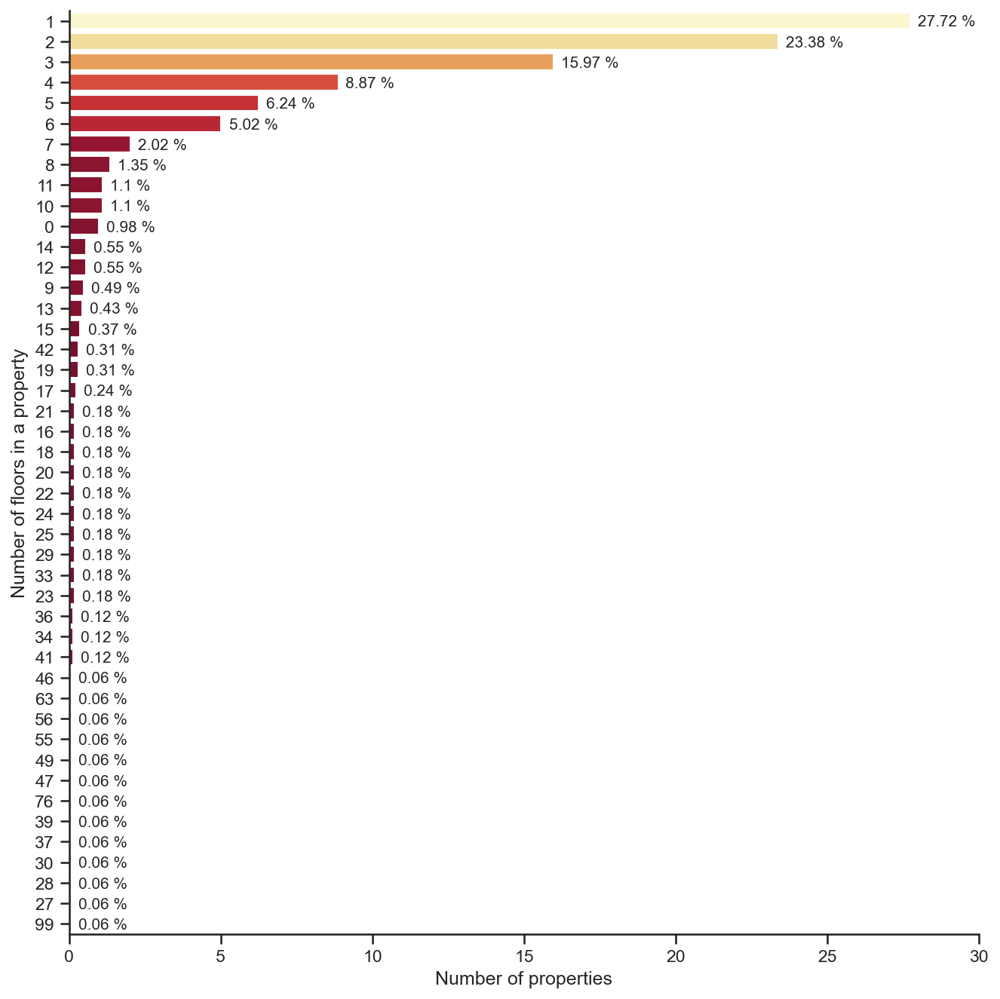

Wall time: 950 ms


In [71]:
%%time

# Dataframe or serie to plot.
df = pd.DataFrame(data_cleaned['NumberofFloors'].value_counts() / data_cleaned['NumberofFloors'].value_counts().sum() * 100)

# Figure environement parameters.
fig = plt.figure(figsize=(9, 9), dpi=150)

# Generate the graphic.
sns_graphic_bar(df, x_threshold=0.25, y_threshold=-0.25, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')#, pal="b"

plt.title('')
plt.xlabel('Number of properties')
plt.ylabel('Number of floors in a property')
plt.xlim(0,30)

plt.tight_layout()

plt.show()

# Export the figure.
fig.savefig(export_fig_path(fig, fig_title = '', fig_title_suffix=' NumberOfFloors_BarPlot'))

There are a majority of buildings having only one ground floor but there are a good proportion of buildings having between 2 to 5 floors.<br>
=> Buildings shown as getting a number of floors of zero will be considered at having the average number of floors among all buildings.

In [72]:
%%time

# Calculate the mean number of floors by building.
nb_of_floors_mean = round(data_cleaned[data_cleaned['NumberofFloors'] != 0]['NumberofFloors'].mean(), 0)
print('In average buildings have: %i floors' % nb_of_floors_mean)

In average buildings have: 4 floors
Wall time: 1e+03 µs


In [73]:
%%time

# Set the 0 value to 1.
data_cleaned['NumberofFloors'].replace(0, nb_of_floors_mean, inplace=True)

# Show.
print('There is %i building with no floor anymore.' % len(data_cleaned[data_cleaned['NumberofBuildings'] <= 0]))

There is 0 building with no floor anymore.
Wall time: 1 ms


## 6) Seattle main areas

### a) Neighborhood

In [74]:
import folium

In [75]:
def circle_marked_map (df, lat, lon, group_col = None, popup = None, color = None, radius = 100,
                       fill = True, opacity = 0.8, zoom_start = 11, reverse_palette = False):
    
    """
    Description
    -----------
    Display interactive groups of round markers on a map at the specified locations and with the specified colors.
    
    Requirements
    ------------
    Folium library: import folium
    
    Parameters
    ----------
    df: pandas.DataFrame
        Pandas dataframe to process.
    lat: float or int
        Object latitude.
    lon: float or int
        Object longitude.
    group_col: int
        Integer values used as color references for maker groups.
    popup: str
        Text to display while sliding the mouse cursor over the makers.
    color: list
        Ordered list of colors for the different marker groups.
        NB: There has to be at least as much colors in the list as there are groups to color in "group_col".
    radius: int
        Radius size of the round markers.
    fill: bool
        Set if the inner marker is filled or not.
    opacity: float in range [0,1]
        Set transparency of the markers (lower is better).
    zoom_start: int
        Set the camera zoom on the map when first displayed.

    Return
    ------
    Return the marked map.

    """
    
    # Place the view at the average coordinate of all locations to display on the interactive_map.
    interactive_map = folium.Map(location = [df[lat].mean(), df[lon].mean()], zoom_start = zoom_start)
    
    # Select the group of dots to color.
    for i in range(0, df[group_col].nunique()):
        df_filtered = df[df[group_col] == np.sort(df[group_col].unique())[i]]
        #print('df_filter=', df_filtered)
        #print('i=%s' % i)
        #print('value=%s' % int(df[group_col].unique()[i]))
        
        # Place a circle at the coordinate of each object location to show them on the interactive_map. 
        for j in range(0, len(df_filtered)):
            #print('j=%i' % j)
            if reverse_palette:
                i = -i
            folium.Circle(location = [df_filtered.iloc[j][lat], df_filtered.iloc[j][lon]],
                          popup = df_filtered.iloc[j][popup], color=color[i],
                          radius = radius, fill=fill, opacity=opacity).add_to(interactive_map)#color[j]
            
    return interactive_map

Names are written in lowercase and composed words are spaced unlike in the "data_cleaned" df which is written in uppercase and withour spacing.<br>
=> These words needs to be changed in their uppercase counterparts without spacing.

In [76]:
%%time

# Set all area names to the same text format which will make the column more consistent and remove duplicates.
data_cleaned['Neighborhood'] = data_cleaned['Neighborhood'].map(lambda x: x.upper())

# Show
data_cleaned['Neighborhood'].unique()

Wall time: 1 ms


array(['DOWNTOWN', 'SOUTHEAST', 'NORTHEAST', 'EAST', 'NORTH',
       'LAKE UNION', 'GREATER DUWAMISH', 'MAGNOLIA / QUEEN ANNE',
       'BALLARD', 'NORTHWEST', 'CENTRAL', 'SOUTHWEST', 'DELRIDGE',
       'DELRIDGE NEIGHBORHOODS'], dtype=object)

In [77]:
data_cleaned[['Neighborhood', 'CouncilDistrictCode']].groupby('Neighborhood').mean()

,CouncilDistrictCode
Neighborhood,
BALLARD,6.000000
CENTRAL,3.000000
DELRIDGE,1.000000
DELRIDGE NEIGHBORHOODS,1.000000
DOWNTOWN,6.295775
EAST,3.225000
GREATER DUWAMISH,1.921053
LAKE UNION,5.469388
MAGNOLIA / QUEEN ANNE,7.000000


"CouncilDistrictCode" seems to show that Delridge, Delridge neighborhood and southwest are about the same area or that 2 are subareas of the other such as the russian matryoshkas.<br>
=> Let's have a look on a map.

In [78]:
%%time

df = data_cleaned

neighborhood_names = np.sort(df['Neighborhood'].unique())

j = 1
neighborhood_ID_dict = {}
for i in neighborhood_names:
    neighborhood_ID_dict.update({i:j})
    j = j + 1
    
neighborhood_ID_dict

Wall time: 1 ms


{'BALLARD': 1,
 'CENTRAL': 2,
 'DELRIDGE': 3,
 'DELRIDGE NEIGHBORHOODS': 4,
 'DOWNTOWN': 5,
 'EAST': 6,
 'GREATER DUWAMISH': 7,
 'LAKE UNION': 8,
 'MAGNOLIA / QUEEN ANNE': 9,
 'NORTH': 10,
 'NORTHEAST': 11,
 'NORTHWEST': 12,
 'SOUTHEAST': 13,
 'SOUTHWEST': 14}

In [79]:
%%time

### Generate the color palette ID references ###

df = data_cleaned

# Create the new column with the values of the one to numerize.
df['Neighborhood_ID'] = df['Neighborhood']

# Numerize the values.
df['Neighborhood_ID'] = df['Neighborhood_ID'].map(neighborhood_ID_dict)
#NB: Another method (3x slower) to do the same thing: data_cleaned = data_cleaned.replace({'Neighborhood_ID': neighborhood_ID_dict})

df[['Neighborhood', 'Neighborhood_ID']].groupby('Neighborhood').mean()

#Add the column to the df.
data_cleaned['Neighborhood_ID'] = df['Neighborhood_ID']

Wall time: 3 ms


In [80]:
%%time

df = data_cleaned[data_cleaned['Neighborhood'].str.contains('DELRIDGE')]

# Set the columns which the coloration will be based on.
group_col = 'Neighborhood_ID'

# Set the color list.
# NB1: In a way that there are as much colors as there are groups of markers.
# NB2: as_hex() allows to get the hexadecimal form of the sns.color_palette list.
nb_of_colors = df[group_col].nunique()

colors = sns.color_palette('deep', n_colors=nb_of_colors).as_hex()

m = circle_marked_map(df, lat='Latitude', lon='Longitude', group_col=group_col,
                                         popup='Neighborhood', color=colors, radius=100, zoom_start = 13)

m

Wall time: 29 ms


Delridge and Delridge neighborhood seem to represent the same area.<br>
=> In "Neighborhood" "DELRIDGE NEIGHBORHOOD" should be replaced by "DELRIDGE".

In [81]:
data_cleaned['Neighborhood'].replace('DELRIDGE NEIGHBORHOODS', 'DELRIDGE', inplace=True)
data_cleaned[['Neighborhood', 'CouncilDistrictCode']].groupby('Neighborhood').mean()

,CouncilDistrictCode
Neighborhood,
BALLARD,6.000000
CENTRAL,3.000000
DELRIDGE,1.000000
DOWNTOWN,6.295775
EAST,3.225000
GREATER DUWAMISH,1.921053
LAKE UNION,5.469388
MAGNOLIA / QUEEN ANNE,7.000000
NORTH,4.969231


### b) ZipCode

In [82]:
# Check rows with a missing zipcode.
data_cleaned[data_cleaned['ZipCode'].isna()][['PropertyName', 'Latitude', 'Longitude']]

,PropertyName,Latitude,Longitude
3360,Northgate Community Center,47.70541,-122.32232
3361,Fire Station 06 (New),47.59905,-122.29787
3362,Fire Station 35 (New),47.69330,-122.37717
3363,Fire Station 39 (New),47.72126,-122.29735
3364,Ballard Community Center,47.67295,-122.39228
3365,Ballard Pool,47.67734,-122.37624
3366,Central West HQ / Brown Bear,47.63572,-122.37525
3367,Conservatory Campus,47.63228,-122.31574
3368,Garfield Community Center,47.60775,-122.30225
3369,Genesee/SC SE HQ,47.56440,-122.27813


In [83]:
# Create a df with the filled zipcodes.
# NB: Zipcodes found on google maps.
zipcode_missing = [98125, 98144, 98117, 98125, 98107, 98117, 98119, 98112, 98122, 98118, 98126, 98108, 98104, 98119, 98108, 98108]
idx = data_cleaned[data_cleaned['ZipCode'].isna()].index
missing_zipcodes = pd.DataFrame({'ZipCode': zipcode_missing}, index = idx)

# Replace the missing zipcodes by the right ones.
data_cleaned.fillna(missing_zipcodes, inplace=True)

# Check the results.
data_cleaned.loc[idx][['ZipCode']]

,ZipCode
3360,98125.0
3361,98144.0
3362,98117.0
3363,98125.0
3364,98107.0
3365,98117.0
3366,98119.0
3367,98112.0
3368,98122.0
3369,98118.0


## 7) Localization of the different properties on a map

To do so, the folium library will be used.<br>
"Folium is a library that uses JavaScript leaflet.js module in the background and it enables interactive map visualizations in Python." (Source: https://medium.com/datasciencearth/map-visualization-with-folium-d1403771717).<br>

Documentation of folium: http://python-visualization.github.io/folium/

### a) Localization by council districts

In [84]:
%%time

df = data_cleaned

# Set the columns which the coloration will be based on.
group_col = 'CouncilDistrictCode'

# Set the color list.
# NB1: In a way that there are as much colors as there are groups of markers.
# NB2: as_hex() allows to get the hexadecimal form of the sns.color_palette list.
nb_of_colors = df[group_col].nunique()
colors = sns.color_palette(n_colors=nb_of_colors).as_hex()

m = circle_marked_map(df, lat='Latitude', lon='Longitude', group_col=group_col,
                                         popup='CouncilDistrictCode', color=colors, radius = 40, zoom_start=10)

m

Wall time: 522 ms


Buildings are located in Seattle as expected.

### b) Localization by Neigbourhood ID

In [85]:
%%time

df = data_cleaned

# Set the columns which the coloration will be based on.
group_col = 'Neighborhood_ID'

# Set the color list.
# NB1: In a way that there are as much colors as there are groups of markers.
# NB2: as_hex() allows to get the hexadecimal form of the sns.color_palette list.
nb_of_colors = df[group_col].nunique()
colors = sns.color_palette('deep', n_colors=nb_of_colors).as_hex()

m = circle_marked_map(df, lat='Latitude', lon='Longitude', group_col=group_col,
                                         popup='Neighborhood', color=colors, radius = 50)

m

Wall time: 525 ms


Comparing with the previous map, it is noticeable that council numbers are not set based on districts.

In [86]:
display_EZ(data_cleaned)

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity,Neighborhood_ID
0,1,NonResidential,Hotel,Mayflower park hotel,405 Olive way,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,182.500000,7.226362e+06,2003882.00,3.946027e+06,1.276453e+06,False,Compliant,249.98,2.83,5
1,2,NonResidential,Hotel,Paramount Hotel,724 Pine street,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,176.100006,8.387933e+06,0.00,3.242851e+06,5.145082e+06,False,Compliant,295.86,2.86,5
2,3,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,241.899994,7.258702e+07,21566554.00,4.952666e+07,1.493800e+06,False,Compliant,2089.28,2.19,5
3,5,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,216.199997,6.794584e+06,2214446.25,2.768924e+06,1.811213e+06,False,Compliant,286.43,4.67,5
4,8,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,211.399994,1.417261e+07,0.00,5.368607e+06,8.803998e+06,False,Compliant,505.01,2.88,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,98108.0,1624049080,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,161.699997,8.497457e+05,0.00,5.242709e+05,3.254750e+05,True,Error - Correct Default Data,20.94,1.70,7
3372,50223,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,98104.0,3558300000,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,114.199997,9.502762e+05,0.00,3.965461e+05,5.537300e+05,False,Compliant,32.17,2.01,5
3373,50224,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,98119.0,1794501150,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recreation, Swimming Pool",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimming Pool,0.0,NaN,NaN,438.200012,744.799988,5.765898e+06,0.00,1.792159e+06,3.973739e+06,False,Compliant,223.54,16.99,9
3374,50225,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,98108.0,7883603155,1,GREATER DUWAMISH,47.52832,-122.32431,1989,1.0,1,14101,0,14101,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,6601.0,Fitness Center/Health Club/Gym,6501.0,Pre-school/Daycare,484.0,NaN,NaN,51.000000,105.300003,7.194712e+05,0.00,3.488702e+05,3.706010e+05,False,Compliant,22.11,1.57,7


### c) Localization by ZipCode

In [87]:
%%time

df = data_cleaned

# Set the columns which the coloration will be based on.
group_col = 'ZipCode'

# Set the color list.
# NB1: In a way that there are as much colors as there are groups of markers.
# NB2: as_hex() allows to get the hexadecimal form of the sns.color_palette list.
nb_of_colors = df[group_col].nunique()
colors = sns.color_palette('deep', n_colors=nb_of_colors).as_hex()

m = circle_marked_map(df, lat='Latitude', lon='Longitude', group_col=group_col,
                                         popup='ZipCode', color=colors, radius = 50,
                                         reverse_palette=False)

m

Wall time: 603 ms


### d) Localization by total energy consumption

In [88]:
%%time

df = data_cleaned

# Set the columns which the coloration will be based on.
group_col = 'SiteEnergyUse(kBtu)'

# Set the color list.
# NB1: In a way that there are as much colors as there are groups of markers.
# NB2: as_hex() allows to get the hexadecimal form of the sns.color_palette list.
nb_of_colors = df[group_col].nunique()
colors = sns.color_palette('YlOrRd', n_colors=nb_of_colors).as_hex()

m = circle_marked_map(df, lat='Latitude', lon='Longitude', group_col=group_col,
                                         popup='SiteEnergyUse(kBtu)', color=colors, radius = 50,
                                         reverse_palette=False)

m

Wall time: 1.38 s


### e) Localization by total GHG emissions

In [89]:
%%time

df = data_cleaned

# Set the columns which the coloration will be based on.
group_col = 'TotalGHGEmissions'

# Set the color list.
# NB1: In a way that there are as much colors as there are groups of markers.
# NB2: as_hex() allows to get the hexadecimal form of the sns.color_palette list.
nb_of_colors = df[group_col].nunique()
colors = sns.color_palette('YlOrRd', n_colors=nb_of_colors).as_hex()

m = circle_marked_map(df, lat='Latitude', lon='Longitude', group_col=group_col,
                      popup='TotalGHGEmissions', color=colors, radius=50,
                      reverse_palette=False)

m

Wall time: 1.25 s


In [90]:
df = data_cleaned.groupby('ZipCode').sum()[['NumberofBuildings', 'TotalGHGEmissions']]
df[['Latitude', 'Longitude']] = data_cleaned.groupby('ZipCode').mean()[['Latitude', 'Longitude']]
df['TotalGHGEmissions/NbBuildings'] = df['TotalGHGEmissions'].astype(float)/df['NumberofBuildings'].astype(float)
df

,NumberofBuildings,TotalGHGEmissions,Latitude,Longitude,TotalGHGEmissions/NbBuildings
ZipCode,,,,,
98006.0,1.0,50.17,47.606040,-122.339480,50.170000
98011.0,1.0,294.65,47.610560,-122.336610,294.650000
98013.0,2.0,683.38,47.694995,-122.345165,341.690000
98020.0,1.0,77.84,47.655760,-122.342080,77.840000
98033.0,1.0,48.76,47.620530,-122.358420,48.760000
98053.0,1.0,13.07,47.573110,-122.360100,13.070000
98070.0,1.0,157.77,47.664100,-122.331180,157.770000
98101.0,147.0,51520.43,47.610206,-122.335578,350.479116
98102.0,26.0,4607.24,47.636232,-122.324029,177.201538


In [91]:
%%time

# Set the columns which the coloration will be based on.
group_col = 'TotalGHGEmissions/NbBuildings'

# Set the color list.
# NB1: In a way that there are as much colors as there are groups of markers.
# NB2: as_hex() allows to get the hexadecimal form of the sns.color_palette list.
nb_of_colors = df[group_col].nunique()
colors = sns.color_palette('YlOrRd', n_colors=nb_of_colors).as_hex()

m = circle_marked_map(df, lat='Latitude', lon='Longitude', group_col=group_col,
                      popup='TotalGHGEmissions/NbBuildings', color=colors, radius=1000,
                      reverse_palette=False)

m

Wall time: 30 ms


## 8) Building usage

In [93]:
%%time

nan_to_null_variables = ['PropertyName', 'PrimaryPropertyType', 'LargestPropertyUseType', 'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
                         'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA']

data_cleaned[nan_to_null_variables]

Wall time: 1 ms


,PropertyName,PrimaryPropertyType,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA
0,Mayflower park hotel,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN
1,Paramount Hotel,Hotel,Hotel,83880.0,Parking,15064.0,Restaurant,4622.0
2,5673-The Westin Seattle,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN
3,HOTEL MAX,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN
4,WARWICK SEATTLE HOTEL (ID8),Hotel,Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0
...,...,...,...,...,...,...,...,...
3371,Horticulture building,Office,Office,12294.0,NaN,NaN,NaN,NaN
3372,International district/Chinatown CC,Other,Other - Recreation,16000.0,NaN,NaN,NaN,NaN
3373,Queen Anne Pool,Other,Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimming Pool,0.0
3374,South Park Community Center,Mixed Use Property,Other - Recreation,6601.0,Fitness Center/Health Club/Gym,6501.0,Pre-school/Daycare,484.0


In [94]:
display_EZ(data_cleaned, max_cols = None)

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity,Neighborhood_ID
0,1,NonResidential,Hotel,Mayflower park hotel,405 Olive way,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,182.500000,7.226362e+06,2003882.00,3.946027e+06,1.276453e+06,False,Compliant,249.98,2.83,5
1,2,NonResidential,Hotel,Paramount Hotel,724 Pine street,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,176.100006,8.387933e+06,0.00,3.242851e+06,5.145082e+06,False,Compliant,295.86,2.86,5
2,3,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,241.899994,7.258702e+07,21566554.00,4.952666e+07,1.493800e+06,False,Compliant,2089.28,2.19,5
3,5,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,216.199997,6.794584e+06,2214446.25,2.768924e+06,1.811213e+06,False,Compliant,286.43,4.67,5
4,8,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,211.399994,1.417261e+07,0.00,5.368607e+06,8.803998e+06,False,Compliant,505.01,2.88,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,98108.0,1624049080,2,GREATER DUWAMISH,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,Office,12294.0,NaN,NaN,NaN,NaN,NaN,46.0,69.099998,161.699997,8.497457e+05,0.00,5.242709e+05,3.254750e+05,True,Error - Correct Default Data,20.94,1.70,7
3372,50223,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,98104.0,3558300000,2,DOWNTOWN,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.0,NaN,NaN,NaN,NaN,NaN,NaN,59.400002,114.199997,9.502762e+05,0.00,3.965461e+05,5.537300e+05,False,Compliant,32.17,2.01,5
3373,50224,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,98119.0,1794501150,7,MAGNOLIA / QUEEN ANNE,47.63644,-122.35784,1974,1.0,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recreation, Swimming Pool",Other - Recreation,7583.0,Fitness Center/Health Club/Gym,5574.0,Swimming Pool,0.0,NaN,NaN,438.200012,744.799988,5.765898e+06,0.00,1.792159e+06,3.973739e+06,False,Compliant,223.54,16.99,9
3374,50225,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,98108.0,7883603155,1,GREATER DUWAMISH,47.52832,-122.32431,1989,1.0,1,14101,0,14101,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",Other - Recreation,6601.0,Fitness Center/Health Club/Gym,6501.0,Pre-school/Daycare,484.0,NaN,NaN,51.000000,105.300003,7.194712e+05,0.00,3.488702e+05,3.706010e+05,False,Compliant,22.11,1.57,7


### a) Choice of the column to represent the main building usage

#### i. Comparison

In [95]:
# Show NaN of the two columns showing the main building usages.
data_cleaned[data_cleaned['LargestPropertyUseType'].isna() |
            data_cleaned['PrimaryPropertyType'].isna()][['PrimaryPropertyType', 'LargestPropertyUseType', 'ListOfAllPropertyUseTypes']]

,PrimaryPropertyType,LargestPropertyUseType,ListOfAllPropertyUseTypes
353,Self-Storage Facility,NaN,"Fitness Center/Health Club/Gym, Office, Other ..."
578,Small- and Mid-Sized Office,NaN,NaN
1147,Hotel,NaN,Hotel
2414,Small- and Mid-Sized Office,NaN,Office
2459,Restaurant,NaN,Restaurant
2670,Mixed Use Property,NaN,NaN


In [96]:
display(data_cleaned['PrimaryPropertyType'].nunique(), data_cleaned['PrimaryPropertyType'].unique(), 
        data_cleaned['LargestPropertyUseType'].nunique(), data_cleaned['LargestPropertyUseType'].unique())

22

array(['Hotel', 'Other', 'Mixed Use Property', 'K-12 School',
       'University', 'Small- and Mid-Sized Office',
       'Self-Storage Facility', 'Warehouse', 'Large Office',
       'Senior Care Community', 'Medical Office', 'Retail Store',
       'Hospital', 'Residence Hall', 'Distribution Center',
       'Worship Facility', 'Supermarket / Grocery Store', 'Laboratory',
       'Refrigerated Warehouse', 'Restaurant', 'Low-Rise Multifamily',
       'Office'], dtype=object)

55

array(['Hotel', 'Police Station', 'Other - Entertainment/Public Assembly',
       'Library', 'Fitness Center/Health Club/Gym', 'Social/Meeting Hall',
       'Courthouse', 'Other', 'K-12 School', 'College/University',
       'Automobile Dealership', 'Office', 'Self-Storage Facility',
       'Non-Refrigerated Warehouse', 'Other - Mall',
       'Senior Care Community', 'Medical Office', 'Retail Store',
       'Hospital (General Medical & Surgical)', 'Museum',
       'Repair Services (Vehicle, Shoe, Locksmith, etc)',
       'Other - Lodging/Residential', 'Residence Hall/Dormitory',
       'Other/Specialty Hospital', 'Financial Office',
       'Distribution Center', 'Parking', 'Multifamily Housing',
       'Worship Facility', 'Restaurant', 'Data Center', 'Laboratory',
       'Supermarket/Grocery Store', 'Urgent Care/Clinic/Other Outpatient',
       nan, 'Other - Services', 'Strip Mall',
       'Wholesale Club/Supercenter', 'Refrigerated Warehouse',
       'Manufacturing/Industrial Plant', '

In [97]:
%%time

# Make a corresponding df for categorical words in "LargestPropertyUseType" associated to catagorical words in "PrimaryPropertyType".
corresponding_list_Larg = pd.DataFrame(data_cleaned.groupby('PrimaryPropertyType')['LargestPropertyUseType'].apply(set).apply(lambda list: [x for x in list if str(x) != 'nan']))
corresponding_list_2ndLarg = pd.DataFrame(data_cleaned.groupby('PrimaryPropertyType')['SecondLargestPropertyUseType'].apply(set).apply(lambda list: [x for x in list if str(x) != 'nan']))
corresponding_list_3rdLarg = pd.DataFrame(data_cleaned.groupby('PrimaryPropertyType')['ThirdLargestPropertyUseType'].apply(set).apply(lambda list: [x for x in list if str(x) != 'nan']))

corresponding_list = pd.concat([corresponding_list_Larg, corresponding_list_2ndLarg, corresponding_list_3rdLarg], axis=1)

display_EZ(corresponding_list_Larg, max_colwidth=None)

,LargestPropertyUseType
PrimaryPropertyType,
Distribution Center,[Distribution Center]
Hospital,[Hospital (General Medical & Surgical)]
Hotel,[Hotel]
K-12 School,[K-12 School]
Laboratory,[Laboratory]
Large Office,[Office]
Low-Rise Multifamily,[Multifamily Housing]
Medical Office,[Medical Office]
Mixed Use Property,"[Distribution Center, Other - Entertainment/Public Assembly, Strip Mall, Other - Restaurant/Bar, Non-Refrigerated Warehouse, Fitness Center/Health Club/Gym, Hotel, Other, Parking, Bank Branch, Social/Meeting Hall, Retail Store, Other - Education, Residence Hall/Dormitory, Supermarket/Grocery Store, Office, Medical Office, Other - Recreation, Laboratory, Multifamily Housing, Restaurant]"


Wall time: 15 ms


First, it is noticeable that "PrimaryPropertyType" is equivalent to "LargestPropertyUseType" but not to "Second-" and "Third-" "LargestPropertyUseType".<br>
=> "PrimaryPropertyType" and "LargestPropertyUseType" seem to both show the first usability of a building but "LargestPropertyUseType" is more detailed with more categories. These 2 variables act as duplicate on each other.<br>
**=> One should be selected and the other one dropped.**

Second, "Second-" and "Third-" "LargestPropertyUseType" appear to have the same keywords as "LargestPropertyUseType".<br>
=> That's why, it would be more coherent to keep "LargestPropertyUseType" over "PrimaryPropertyType".

Before dropping "PrimaryPropertyType", maybe it is possible to use it to make some imputation over "LargestPropertyUseType".<br>
=> Let's check that.

#### ii. Check if imputations are possible

In [98]:
%%time

# Data to imput in "LargestPropertyUseType"
data_to_impute = data_cleaned[data_cleaned['LargestPropertyUseType'].isna()][['PrimaryPropertyType', 'LargestPropertyUseType']]
data_to_impute

Wall time: 1 ms


,PrimaryPropertyType,LargestPropertyUseType
353,Self-Storage Facility,NaN
578,Small- and Mid-Sized Office,NaN
1147,Hotel,NaN
2414,Small- and Mid-Sized Office,NaN
2459,Restaurant,NaN
2670,Mixed Use Property,NaN


A very few rows can be imputed.

In [99]:
# Display the "PrimaryPropertyType" to "LargestPropertyUseType" correspondance dictionnary.
corresponding_list.iloc[:,0].to_dict()

{'Distribution Center': ['Distribution Center'],
 'Hospital': ['Hospital (General Medical & Surgical)'],
 'Hotel': ['Hotel'],
 'K-12 School': ['K-12 School'],
 'Laboratory': ['Laboratory'],
 'Large Office': ['Office'],
 'Low-Rise Multifamily': ['Multifamily Housing'],
 'Medical Office': ['Medical Office'],
 'Mixed Use Property': ['Distribution Center',
  'Other - Entertainment/Public Assembly',
  'Strip Mall',
  'Other - Restaurant/Bar',
  'Non-Refrigerated Warehouse',
  'Fitness Center/Health Club/Gym',
  'Hotel',
  'Other',
  'Parking',
  'Bank Branch',
  'Social/Meeting Hall',
  'Retail Store',
  'Other - Education',
  'Residence Hall/Dormitory',
  'Supermarket/Grocery Store',
  'Office',
  'Medical Office',
  'Other - Recreation',
  'Laboratory',
  'Multifamily Housing',
  'Restaurant'],
 'Office': ['Office'],
 'Other': ['Data Center',
  'Urgent Care/Clinic/Other Outpatient',
  'Other/Specialty Hospital',
  'Pre-school/Daycare',
  'Library',
  'Other - Entertainment/Public Assembly

In [100]:
%%time

df = data_to_impute

# Replace missing categories in "LargestPropertyUseType" relying on the "PrimaryPropertyType" to "LargestPropertyUseType" correspondance dictionnary.
df['LargestPropertyUseType'] = df['PrimaryPropertyType'].map(corresponding_list.iloc[:,0].to_dict())
#NB: Another method (3x slower) to do the same thing: data_cleaned = data_cleaned.replace({'LargestPropertyUseType': corresponding_list.iloc[:,0]})

display_EZ(data_to_impute.loc[data_to_impute.index.to_list(),:], max_colwidth=None)

,PrimaryPropertyType,LargestPropertyUseType
353,Self-Storage Facility,[Self-Storage Facility]
578,Small- and Mid-Sized Office,[Office]
1147,Hotel,[Hotel]
2414,Small- and Mid-Sized Office,[Office]
2459,Restaurant,"[Other - Restaurant/Bar, Restaurant]"
2670,Mixed Use Property,"[Distribution Center, Other - Entertainment/Public Assembly, Strip Mall, Other - Restaurant/Bar, Non-Refrigerated Warehouse, Fitness Center/Health Club/Gym, Hotel, Other, Parking, Bank Branch, Social/Meeting Hall, Retail Store, Other - Education, Residence Hall/Dormitory, Supermarket/Grocery Store, Office, Medical Office, Other - Recreation, Laboratory, Multifamily Housing, Restaurant]"


Wall time: 4 ms


In [101]:
# Convert all lists in string format for later coeherence with the dataset "data_cleaned".
data_to_impute = data_to_impute.LargestPropertyUseType.apply(lambda list: ','.join(x for x in list))

In [102]:
# Replace the multiple categories in row 2459 by "Restaurant".
data_to_impute = data_to_impute.replace('Other - Restaurant/Bar,Restaurant', 'Restaurant')
data_to_impute

353                                 Self-Storage Facility
578                                                Office
1147                                                Hotel
2414                                               Office
2459                                           Restaurant
2670    Distribution Center,Other - Entertainment/Publ...
Name: LargestPropertyUseType, dtype: object

In [103]:
# Get key information to identify the building on web browsing.
data_cleaned[['PropertyName', 'ZipCode']].loc[2670]

PropertyName    KALBERG BUILDING
ZipCode                    98105
Name: 2670, dtype: object

Checking on internet what is the Kalberg building it seems it is mainly used for "retail stores" and "offices". I guess retail stores consume more electricity in general than offices (enlighting products all day long, temperature control for some products etc...).<br>
=> This building will be consider as a "Retail Store".

Source 1: https://www.pacificcontinentalrealty.com/listing/4517-university-way-seattle-wa-98105-kalberg-building-3/<br>
Source 2: https://search.brave.com/search?q=kalberg+building+seattle+main+use&source=web

In [104]:
# Replace the multiple categories in row 2670 by "Retail Store".
data_to_impute = data_to_impute.str.replace(data_to_impute.loc[2670], 'Retail Store')
data_to_impute

353     Self-Storage Facility
578                    Office
1147                    Hotel
2414                   Office
2459               Restaurant
2670             Retail Store
Name: LargestPropertyUseType, dtype: object

In [105]:
# Remind the rows to process for comparison.
data_cleaned.loc[data_to_impute.index.to_list()]['LargestPropertyUseType']

353     NaN
578     NaN
1147    NaN
2414    NaN
2459    NaN
2670    NaN
Name: LargestPropertyUseType, dtype: object

In [106]:
%%time

# Impute the missing categories in "LargestPropertyUseType".
for idx in data_to_impute.index.to_list():
    data_cleaned.loc[idx,'LargestPropertyUseType'] = data_to_impute.loc[idx]

# Check if all happened well and compare with the previous cell.
data_cleaned.loc[data_to_impute.index.to_list()]['LargestPropertyUseType']

Wall time: 2 ms


353     Self-Storage Facility
578                    Office
1147                    Hotel
2414                   Office
2459               Restaurant
2670             Retail Store
Name: LargestPropertyUseType, dtype: object

In [107]:
data_cleaned[['PrimaryPropertyType', 'ListOfAllPropertyUseTypes', 'LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']].head(25)

,PrimaryPropertyType,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType
0,Hotel,Hotel,Hotel,NaN,NaN
1,Hotel,"Hotel, Parking, Restaurant",Hotel,Parking,Restaurant
2,Hotel,Hotel,Hotel,NaN,NaN
3,Hotel,Hotel,Hotel,NaN,NaN
4,Hotel,"Hotel, Parking, Swimming Pool",Hotel,Parking,Swimming Pool
5,Other,Police Station,Police Station,NaN,NaN
6,Hotel,Hotel,Hotel,NaN,NaN
7,Other,Other - Entertainment/Public Assembly,Other - Entertainment/Public Assembly,NaN,NaN
8,Hotel,Hotel,Hotel,NaN,NaN
10,Hotel,Hotel,Hotel,NaN,NaN


Categories in "ListOfAllPropertyUseTypes" are not set in any property main use type order.<br>
=> Impossible to use it to impute missing data in the property use types variables.

In [108]:
print("As seen earlier, there are %i " % data_cleaned['LargestPropertyUseType'].nunique() + "categories.")

As seen earlier, there are 55 categories.


It is pretty much to encode in one-hot for example.<br>
=> In order to reduce the amount of categories to encode, a remap of the categories will be done.

#### iii. Remap for encoding

In [109]:
# Start building usage keywords dictonary from the previous one.
building_usage_kwds = corresponding_list.iloc[:,0].apply(lambda list: ','.join(x for x in list)).to_dict()
building_usage_kwds

{'Distribution Center': 'Distribution Center',
 'Hospital': 'Hospital (General Medical & Surgical)',
 'Hotel': 'Hotel',
 'K-12 School': 'K-12 School',
 'Laboratory': 'Laboratory',
 'Large Office': 'Office',
 'Low-Rise Multifamily': 'Multifamily Housing',
 'Medical Office': 'Medical Office',
 'Mixed Use Property': 'Distribution Center,Other - Entertainment/Public Assembly,Strip Mall,Other - Restaurant/Bar,Non-Refrigerated Warehouse,Fitness Center/Health Club/Gym,Hotel,Other,Parking,Bank Branch,Social/Meeting Hall,Retail Store,Other - Education,Residence Hall/Dormitory,Supermarket/Grocery Store,Office,Medical Office,Other - Recreation,Laboratory,Multifamily Housing,Restaurant',
 'Office': 'Office',
 'Other': 'Data Center,Urgent Care/Clinic/Other Outpatient,Other/Specialty Hospital,Pre-school/Daycare,Library,Other - Entertainment/Public Assembly,Strip Mall,Personal Services (Health/Beauty, Dry Cleaning, etc),Prison/Incarceration,Lifestyle Center,Police Station,Manufacturing/Industrial Pla

In [110]:
# Check if there are categories present in Second and Third property use type but not in the first one.
display(data_cleaned['SecondLargestPropertyUseType'].unique(), data_cleaned['ThirdLargestPropertyUseType'].unique())

array([nan, 'Parking', 'Office', 'Restaurant', 'K-12 School',
       'Laboratory', 'Refrigerated Warehouse',
       'Non-Refrigerated Warehouse', 'Other - Education',
       'Vocational School', 'Retail Store',
       'Personal Services (Health/Beauty, Dry Cleaning, etc)',
       'Other - Entertainment/Public Assembly', 'Data Center',
       'Swimming Pool', 'Other', 'Courthouse', 'Residence Hall/Dormitory',
       'Distribution Center', 'Self-Storage Facility', 'Other - Services',
       'Movie Theater', 'Supermarket/Grocery Store', 'Medical Office',
       'Other - Recreation', 'Convenience Store without Gas Station',
       'Performing Arts', 'College/University', 'Other - Restaurant/Bar',
       'Adult Education', 'Enclosed Mall', 'Multifamily Housing',
       'Bar/Nightclub', 'Financial Office',
       'Repair Services (Vehicle, Shoe, Locksmith, etc)',
       'Manufacturing/Industrial Plant', 'Other - Lodging/Residential',
       'Bank Branch', 'Fitness Center/Health Club/Gym', 'H

array([nan, 'Restaurant', 'Swimming Pool', 'Data Center', 'Office',
       'Retail Store', 'Other - Entertainment/Public Assembly',
       'Non-Refrigerated Warehouse', 'Other', 'Distribution Center',
       'Food Service', 'Other - Services', 'Medical Office', 'Parking',
       'Other - Utility', 'K-12 School', 'Fitness Center/Health Club/Gym',
       'Social/Meeting Hall', 'Pre-school/Daycare',
       'Convenience Store without Gas Station', 'Financial Office',
       'Other - Restaurant/Bar', 'Other - Education',
       'Multifamily Housing', 'Laboratory', 'Bank Branch', 'Hotel',
       'Other - Recreation',
       'Personal Services (Health/Beauty, Dry Cleaning, etc)',
       'Self-Storage Facility', 'Other - Technology/Science',
       'Refrigerated Warehouse', 'Bar/Nightclub',
       'Manufacturing/Industrial Plant', 'Other/Specialty Hospital',
       'Fast Food Restaurant', 'Worship Facility',
       'Supermarket/Grocery Store', 'Strip Mall', 'Vocational School'],
      dtype=ob

There are some categories to take in count:
- 'Convenience Store without Gas Station'
- 'Other - Technology/Science'
- 'Food Sales'
- 'Fast Food Restaurant'
- 'Enclosed Mall'
- 'Swimming Pool'
- 'Bar/Nightclub'

In [111]:
%%time

# Fixing by hand the dictionary just made.
# NB: In comment are shown the keys to remove later since they were recategorized (only for the operator convinience and limitate mistakes).
building_usage_kwds.update({'Public services': ['Fire Station', 'Police Station', 'Courthouse', 'Prison/Incarceration', 'Other - Public Services', 'Other - Services'],
                            'Library': 'Library',
                            'Banks': 'Bank Branch',
                            'Office': ['Financial Office', 'Office', 'Medical Office'], #'Large Office':, 'Medical Office':, 'Small- and Mid-Sized Office': 
                            'Education' : ['Adult Education', 'Pre-school/Daycare', 'K-12 School', 'College/University', 'Other - Education', 'Vocational School'], #'K-12 School':, 'University': 
                            'Manufacturing/Industrial Plant': 'Manufacturing/Industrial Plant',
                            'Food Service': ['Food Service', 'Other - Restaurant/Bar', 'Restaurant', 'Food Sales', 'Fast Food Restaurant'], # 'Restaurant':  
                            'Supermarket / Grocery Store': ['Supermarket/Grocery Store', 'Wholesale Club/Supercenter'],
                            'Mall': ['Other - Mall', 'Strip Mall', 'Enclosed Mall'],      
                            'General Medical': ['Urgent Care/Clinic/Other Outpatient', 'Hospital (General Medical & Surgical)', 'Other/Specialty Hospital'], # Hospital:
                            'Data Center': 'Data Center',
                            'Entertainment': ['Movie Theater', 'Museum', 'Other - Entertainment/Public Assembly', 'Fitness Center/Health Club/Gym', 'Other - Recreation', 'Performing Arts', 'Swimming Pool', 'Bar/Nightclub'],
                            'Retail Store': 'Retail Store',
                            'Senior Care Community': ['Senior Care Community', 'Residential Care Facility'],             
                            'Other':
                                ['Convention Center',
                                'Residence Hall/Dormitory', #'Residence Hall': 
                                'Multifamily Housing', #'Low-Rise Multifamily': 
                                'Laboratory', #'Laboratory':
                                'Personal Services (Health/Beauty, Dry Cleaning, etc)',
                                'Repair Services (Vehicle, Shoe, Locksmith, etc)',
                                'Other',
                                'Other - Utility',
                                'Lifestyle Center',
                                'Other - Lodging/Residential',
                                'Automobile Dealership',
                                'Social/Meeting Hall',
                                'Parking',
                                'Convenience Store without Gas Station',
                                'Other - Technology/Science']
                           })

Wall time: 0 ns


In [112]:
%%time

# Removal of the left useless keys.
keys_to_remove = ['Large Office', 'Medical Office', 'Small- and Mid-Sized Office', 'K-12 School', 'University', 
                  'Restaurant', 'Hospital', 'Residence Hall', 'Low-Rise Multifamily', 'Laboratory', 'Mixed Use Property']

for key in keys_to_remove:
    del building_usage_kwds[key]

print("There are %s " % len(building_usage_kwds) + "keywords.")
display(building_usage_kwds)

There are 21 keywords.


{'Distribution Center': 'Distribution Center',
 'Hotel': 'Hotel',
 'Office': ['Financial Office', 'Office', 'Medical Office'],
 'Other': ['Convention Center',
  'Residence Hall/Dormitory',
  'Multifamily Housing',
  'Laboratory',
  'Personal Services (Health/Beauty, Dry Cleaning, etc)',
  'Repair Services (Vehicle, Shoe, Locksmith, etc)',
  'Other',
  'Other - Utility',
  'Lifestyle Center',
  'Other - Lodging/Residential',
  'Automobile Dealership',
  'Social/Meeting Hall',
  'Parking',
  'Convenience Store without Gas Station',
  'Other - Technology/Science'],
 'Refrigerated Warehouse': 'Refrigerated Warehouse',
 'Retail Store': 'Retail Store',
 'Self-Storage Facility': 'Self-Storage Facility',
 'Senior Care Community': ['Senior Care Community',
  'Residential Care Facility'],
 'Supermarket / Grocery Store': ['Supermarket/Grocery Store',
  'Wholesale Club/Supercenter'],
 'Warehouse': 'Non-Refrigerated Warehouse',
 'Worship Facility': 'Worship Facility',
 'Public services': ['Fire Sta

Wall time: 2 ms


Now we have our corresponding dictionary. However, it cannot be used as it is to convert all old categories to the new ones.<br>
=> It has to be reversed first.

In [113]:
%%time

# Create the intermediate dataframe.
df = pd.DataFrame.from_dict(building_usage_kwds, orient='index')

# Create a new row for each values in lists.
df = df.explode(0)

# Reverse values and indexes in the dataframe.
df = pd.DataFrame(df.index.values, index=df.iloc[:,0])

# Rebuild the usable dictionary from the datagrame.
building_usage_kwds_adjusted = df.iloc[:,0].to_dict()

# Show the result.
print("There are %i" % len(building_usage_kwds_adjusted) + "/%i" % data_cleaned['LargestPropertyUseType'].nunique() 
      + " categories which can be replaced.")
display_EZ(building_usage_kwds_adjusted, None, None, None)

There are 64/55 categories which can be replaced.


{'Distribution Center': 'Distribution Center',
 'Hotel': 'Hotel',
 'Financial Office': 'Office',
 'Office': 'Office',
 'Medical Office': 'Office',
 'Convention Center': 'Other',
 'Residence Hall/Dormitory': 'Other',
 'Multifamily Housing': 'Other',
 'Laboratory': 'Other',
 'Personal Services (Health/Beauty, Dry Cleaning, etc)': 'Other',
 'Repair Services (Vehicle, Shoe, Locksmith, etc)': 'Other',
 'Other': 'Other',
 'Other - Utility': 'Other',
 'Lifestyle Center': 'Other',
 'Other - Lodging/Residential': 'Other',
 'Automobile Dealership': 'Other',
 'Social/Meeting Hall': 'Other',
 'Parking': 'Other',
 'Convenience Store without Gas Station': 'Other',
 'Other - Technology/Science': 'Other',
 'Refrigerated Warehouse': 'Refrigerated Warehouse',
 'Retail Store': 'Retail Store',
 'Self-Storage Facility': 'Self-Storage Facility',
 'Senior Care Community': 'Senior Care Community',
 'Residential Care Facility': 'Senior Care Community',
 'Supermarket/Grocery Store': 'Supermarket / Grocery Store

Wall time: 8.01 ms


Now the new categories are set to replace the old ones in "PropertyUseType" variables.

In [114]:
%%time

# Replace old categories by the new ones.
data_cleaned[['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']] = data_cleaned[['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']].replace(building_usage_kwds_adjusted)

Wall time: 10 ms


In [115]:
# Check if the replacements did happen well.
data_cleaned[['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']].nunique()

LargestPropertyUseType          21
SecondLargestPropertyUseType    19
ThirdLargestPropertyUseType     19
dtype: int64

The categories are now re-mapped in 21 from 56.

## 9) NaN management

### a) Property Usage

#### i. NaN in largest property usage

In [116]:
display_EZ(data_cleaned[data_cleaned['LargestPropertyUseType'].isna()], None, None, None)

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity,Neighborhood_ID


Having a look to these variables, it seems that null values are left as empty cells when there is no secondary or tertiary main use of a property and leads to NaN cells.<br>
=> These variables could be considered as null or as no other property usage except for "LargestPropertyUseType" which should not be empty. This one should be considered as an unfilled mistake.

#### ii. NaN replacement by "No usage" for the PropertyUseTypes

In [117]:
col_nan_to_noinfo = ['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']
nan_to_nodata = 'No usage'

data_cleaned[col_nan_to_noinfo] = data_cleaned[col_nan_to_noinfo].fillna(nan_to_nodata)

#display_EZ(data_cleaned[data_cleaned['LargestPropertyUseType'] == nan_to_nodata], None, None, None)

#### iii. NaN replacement by 0 for NaN surfaces for the PropertyUseTypeGFA

In [118]:
%%time

col_nan_to_zero = ['LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA']

data_cleaned[col_nan_to_zero] = data_cleaned[data_cleaned['LargestPropertyUseType'] != nan_to_nodata][col_nan_to_zero].fillna(0)

Wall time: 2 ms


In [119]:
display_EZ(data_cleaned[nan_to_null_variables].sample(50), max_colwidth = None)

,PropertyName,PrimaryPropertyType,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA
409,K2 and Iron Mountain (Seattle 4),Warehouse,Warehouse,263528.0,Office,60388.0,No usage,0.0
46,Gibraltar Tower,Small- and Mid-Sized Office,Office,34947.0,Retail Store,4993.0,No usage,0.0
2380,Chandler's Cove - SEDO,Mixed Use Property,Food Service,23373.0,Other,19659.0,Other,15402.0
683,WALL & CEILING SUPPLY CO INC,Warehouse,Warehouse,30375.0,No usage,0.0,No usage,0.0
319,1100 Dexter-RREEF SeaDPD ID 456,Large Office,Office,105563.0,Other,0.0,No usage,0.0
2103,View Ridge Elementary,K-12 School,Education,65210.0,No usage,0.0,No usage,0.0
974,Meaves Building,Warehouse,Warehouse,24000.0,Retail Store,6000.0,No usage,0.0
1047,3851 Distribution Center,Distribution Center,Distribution Center,35579.0,No usage,0.0,No usage,0.0
406,Poplar Building,Small- and Mid-Sized Office,Office,60732.0,Other,8142.0,No usage,0.0
3317,Dexter Station,Large Office,Office,359040.0,Other,151658.0,Food Service,1087.0


G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


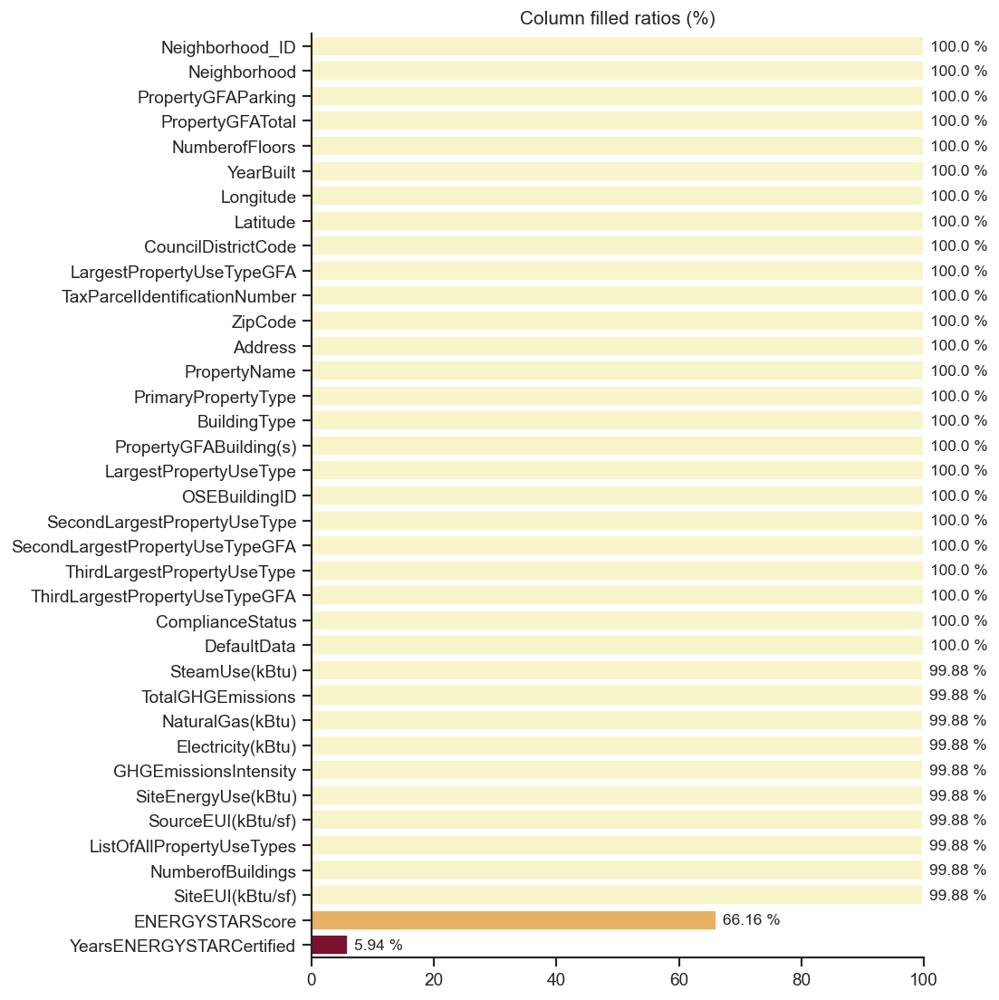

Wall time: 1 s


In [120]:
%%time

cols_filled_ratio = data_filled_ratio(data_cleaned)[0]

fig = plt.figure(figsize=(9, 9), dpi=125)

sns_graphic_bar(cols_filled_ratio, x_threshold=1, y_threshold=-0.175, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')

plt.title('Column filled ratios (%)')
plt.xlabel(None)
plt.xlim(0,100)

plt.tight_layout()
fig.savefig(export_fig_path(fig, fig_title_suffix=' NaN To 0'))

plt.show()

In [121]:
# Columns left with some NaN.
cols_names_w_nan = ['NumberofBuildings', 'GHGEmissionsIntensity', 'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)',
                    'Electricity(kBtu)', 'NaturalGas(kBtu)', 'ListOfAllPropertyUseTypes',
                    'TotalGHGEmissions', 'SourceEUI(kBtu/sf)', 'SiteEUI(kBtu/sf)']

In [122]:
def show_rows_w_nan (df):
        
    """
    Description
    -----------
    Show rows left with some NaN in some features.
    
    Parameters
    ----------
    df: dataframe
        Dataframe to process.
        
    Return
    ------
    A list of rows containing NaN.
    
    """   
    
    all_matched_rows_names = []
    for col in df.columns:
        matched_rows_names = list(df[df[col].isna()].index)
        all_matched_rows_names = all_matched_rows_names + matched_rows_names
        matched_rows_names = []
        
    all_matched_rows_names = list(set(all_matched_rows_names))
                
    return all_matched_rows_names
    

In [123]:
# Find rows left with some NaN.
rows_w_nan = show_rows_w_nan(data_cleaned[cols_names_w_nan])
rows_w_nan

[578, 2670]

In [124]:
display_EZ(data_cleaned.loc[rows_w_nan], None, None, None)

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity,Neighborhood_ID
578,773,NonResidential,Small- and Mid-Sized Office,SEATTLE BUILDING,215 COLUMBIA ST,98104.0,0939000245,7,DOWNTOWN,47.60380,-122.33293,1924,NaN,4,63150,0,63150,NaN,Office,0.0,No usage,0.0,No usage,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,Non-Compliant,NaN,NaN,5
2670,26532,NonResidential,Mixed Use Property,KALBERG BUILDING,4515 UNIVERSITY WAY NE,98105.0,8816401120,4,NORTHEAST,47.66182,-122.31345,1928,NaN,2,20760,0,20760,NaN,Retail Store,0.0,No usage,0.0,No usage,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,Non-Compliant,NaN,NaN,11


Too much important data miss for these rows + notified "non-compliant".<br>
=> They will so be removed.

In [125]:
# Drop the rows.
data_cleaned = data_cleaned.drop(rows_w_nan)

G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


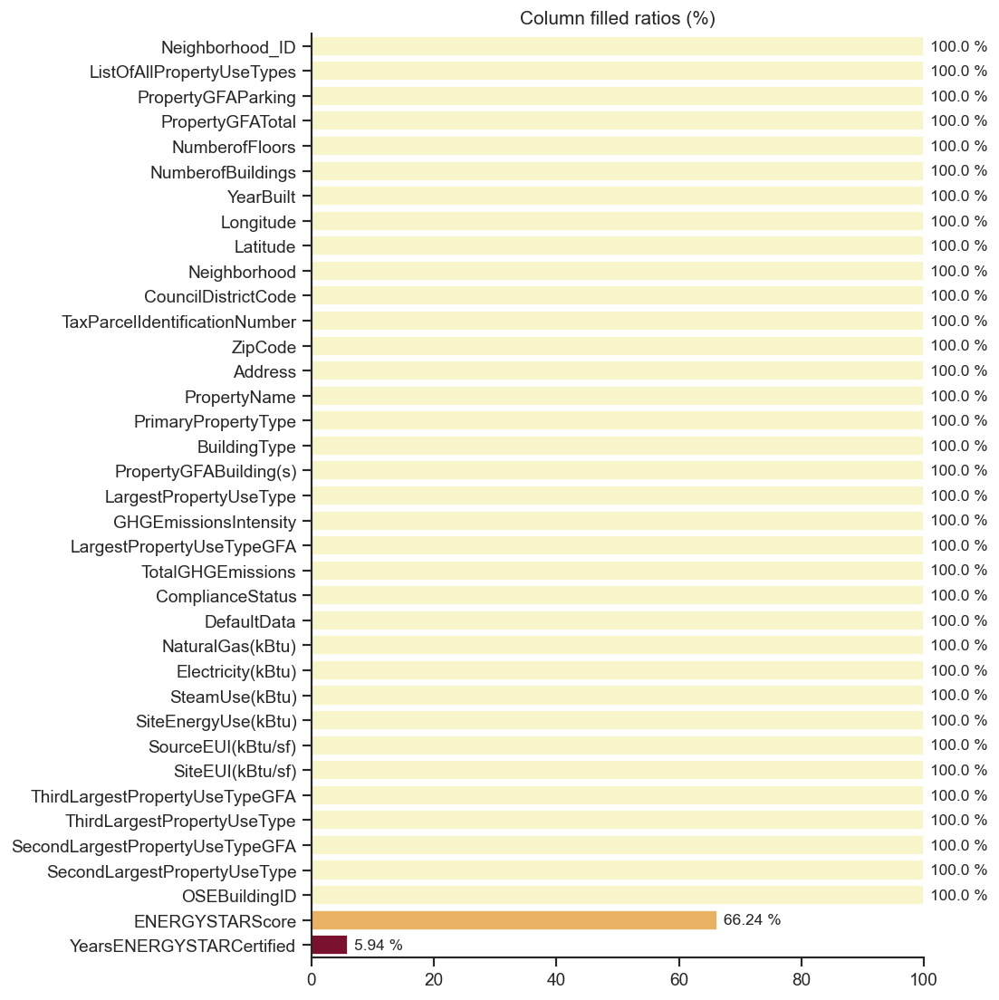

Wall time: 850 ms


In [126]:
%%time

# Check the completion of all features left.

cols_filled_ratio = data_filled_ratio(data_cleaned)[0]

fig = plt.figure(figsize=(9, 9), dpi=125)

sns_graphic_bar(cols_filled_ratio, x_threshold=1, y_threshold=-0.175, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')

plt.title('Column filled ratios (%)')
plt.xlabel(None)
plt.xlim(0,100)

plt.tight_layout()
fig.savefig(export_fig_path(fig, fig_title_suffix=' NaN To 0'))

plt.show()

In [127]:
# Let's have a look to the last NaN in ZipCode feature.
display_EZ(data_cleaned[data_cleaned['ZipCode'].isna()], None, None, None)

,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity,Neighborhood_ID


Only the ZipCode is missing for these properties. However, other features are filled.
=> It would a shame to remove them so. ZipCode won't be selected as a geographical positioning feature for the models.

## 10) Minimizing the number of categorical features to encode and removal of left useless features

**Goal: As text shall be turned into numerical values it is preferrable to minimize the columns to convert by dropping the useless ones.**

In [128]:
# Look for the text formatted columns.
cols_dtypes = data_cleaned.dtypes
cols_dtype_object = list(cols_dtypes[cols_dtypes == np.object].index)
cols_dtype_object

['BuildingType',
 'PrimaryPropertyType',
 'PropertyName',
 'Address',
 'TaxParcelIdentificationNumber',
 'Neighborhood',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'SecondLargestPropertyUseType',
 'ThirdLargestPropertyUseType',
 'YearsENERGYSTARCertified',
 'ComplianceStatus']

In [129]:
useless_left_variables = ['PropertyName',
                          'BuildingType',
                          'PrimaryPropertyType',
                          'Neighborhood',
                          'Address',
                          'TaxParcelIdentificationNumber',
                          'YearsENERGYSTARCertified',
                          'ComplianceStatus',
                          'DefaultData',
                          'YearsENERGYSTARCertified',
                          'ListOfAllPropertyUseTypes']

data_cleaned = data_cleaned.drop(useless_left_variables, axis=1)

G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


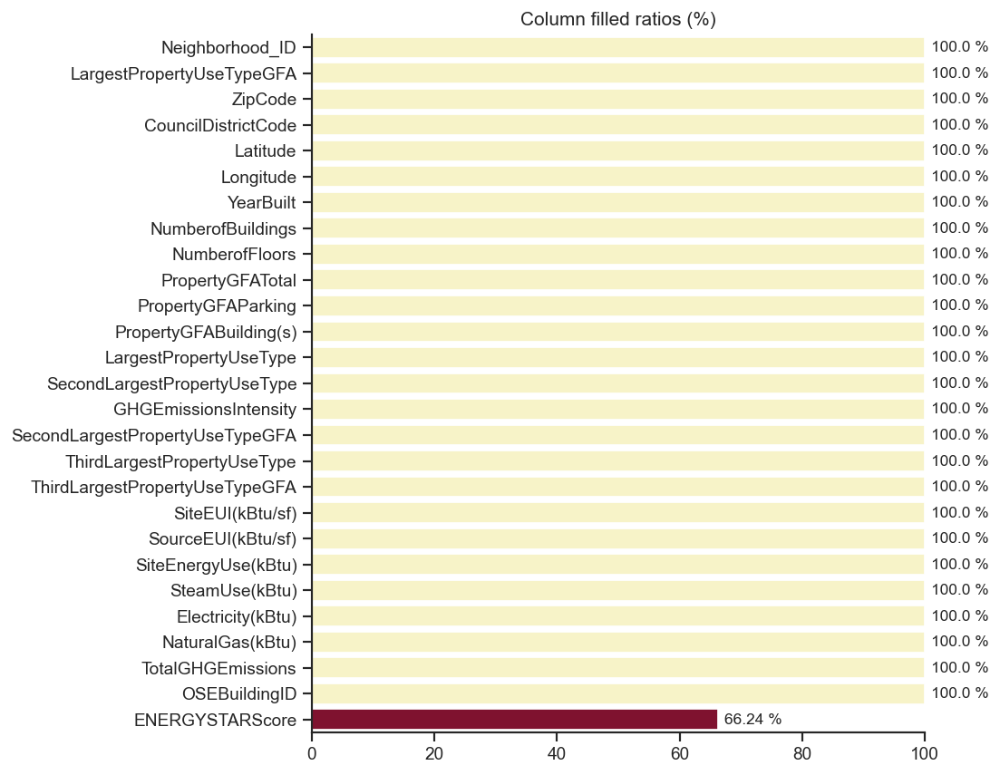

Wall time: 634 ms


In [130]:
%%time

cols_filled_ratio = data_filled_ratio(data_cleaned)[0]

fig = plt.figure(figsize=(9, 7), dpi=125)

sns_graphic_bar(cols_filled_ratio, x_threshold=1, y_threshold=-0.175, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')

plt.title('Column filled ratios (%)')
plt.xlabel(None)
plt.xlim(0,100)

plt.tight_layout()
fig.savefig(export_fig_path(fig, fig_title_suffix=' End_Cleaning'))

plt.show()

## 11) Data encoding

### a) Encoding of the property main usages

In [131]:
cols_dtypes = data_cleaned.dtypes
cols_dtype_object = list(cols_dtypes[cols_dtypes == np.object].index)
cols_dtype_object

['LargestPropertyUseType',
 'SecondLargestPropertyUseType',
 'ThirdLargestPropertyUseType']

In [132]:
data_cleaned[cols_dtype_object]

,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType
0,Hotel,No usage,No usage
1,Hotel,Other,Food Service
2,Hotel,No usage,No usage
3,Hotel,No usage,No usage
4,Hotel,Other,Entertainment
...,...,...,...
3371,Office,No usage,No usage
3372,Entertainment,No usage,No usage
3373,Entertainment,Entertainment,Entertainment
3374,Entertainment,Entertainment,Education


In [133]:
#set(data_cleaned['BuildingType']) #SUPPR., Neighb. or Council, 

None of the categories are ordinal.<br>
=> They should be then encoded in one-hot rather than in ordinal.

In [134]:
from sklearn.preprocessing import OneHotEncoder

In [135]:
encoder = OneHotEncoder()
encoder.fit_transform(data_cleaned[cols_dtype_object].to_numpy())

<1632x61 sparse matrix of type '<class 'numpy.float64'>'
	with 4896 stored elements in Compressed Sparse Row format>

In [136]:
display_EZ(data_cleaned, max_cols=None)

,OSEBuildingID,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,Neighborhood_ID
0,1,98101.0,7,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,88434.0,No usage,0.0,No usage,0.0,60.0,81.699997,182.500000,7.226362e+06,2003882.00,3.946027e+06,1.276453e+06,249.98,2.83,5
1,2,98101.0,7,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,Hotel,83880.0,Other,15064.0,Food Service,4622.0,61.0,94.800003,176.100006,8.387933e+06,0.00,3.242851e+06,5.145082e+06,295.86,2.86,5
2,3,98101.0,7,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,756493.0,No usage,0.0,No usage,0.0,43.0,96.000000,241.899994,7.258702e+07,21566554.00,4.952666e+07,1.493800e+06,2089.28,2.19,5
3,5,98101.0,7,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,61320.0,No usage,0.0,No usage,0.0,56.0,110.800003,216.199997,6.794584e+06,2214446.25,2.768924e+06,1.811213e+06,286.43,4.67,5
4,8,98121.0,7,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,Hotel,123445.0,Other,68009.0,Entertainment,0.0,75.0,114.800003,211.399994,1.417261e+07,0.00,5.368607e+06,8.803998e+06,505.01,2.88,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,98108.0,2,47.56722,-122.31154,1990,1.0,1,12294,0,12294,Office,12294.0,No usage,0.0,No usage,0.0,46.0,69.099998,161.699997,8.497457e+05,0.00,5.242709e+05,3.254750e+05,20.94,1.70,7
3372,50223,98104.0,2,47.59625,-122.32283,2004,1.0,1,16000,0,16000,Entertainment,16000.0,No usage,0.0,No usage,0.0,NaN,59.400002,114.199997,9.502762e+05,0.00,3.965461e+05,5.537300e+05,32.17,2.01,5
3373,50224,98119.0,7,47.63644,-122.35784,1974,1.0,1,13157,0,13157,Entertainment,7583.0,Entertainment,5574.0,Entertainment,0.0,NaN,438.200012,744.799988,5.765898e+06,0.00,1.792159e+06,3.973739e+06,223.54,16.99,9
3374,50225,98108.0,1,47.52832,-122.32431,1989,1.0,1,14101,0,14101,Entertainment,6601.0,Entertainment,6501.0,Education,484.0,NaN,51.000000,105.300003,7.194712e+05,0.00,3.488702e+05,3.706010e+05,22.11,1.57,7


In [137]:
# Select the columns to encode.
cols_to_encode = ['LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
                  'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
                  'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA']
df_to_encode = data_cleaned[cols_to_encode]
display_EZ(df_to_encode)

### For the defense ###
#display_EZ(df_to_encode, max_cols=4)

,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA
0,Hotel,88434.0,No usage,0.0,No usage,0.0
1,Hotel,83880.0,Other,15064.0,Food Service,4622.0
2,Hotel,756493.0,No usage,0.0,No usage,0.0
3,Hotel,61320.0,No usage,0.0,No usage,0.0
4,Hotel,123445.0,Other,68009.0,Entertainment,0.0
...,...,...,...,...,...,...
3371,Office,12294.0,No usage,0.0,No usage,0.0
3372,Entertainment,16000.0,No usage,0.0,No usage,0.0
3373,Entertainment,7583.0,Entertainment,5574.0,Entertainment,0.0
3374,Entertainment,6601.0,Entertainment,6501.0,Education,484.0


In [138]:
# Create an intermediate df which will contain the encoded data. 
PropertyUseType_encoding = pd.DataFrame(index=data_cleaned.index, columns=list(building_usage_kwds.keys()))
display_EZ(PropertyUseType_encoding, max_cols=None)

,Distribution Center,Hotel,Office,Other,Refrigerated Warehouse,Retail Store,Self-Storage Facility,Senior Care Community,Supermarket / Grocery Store,Warehouse,Worship Facility,Public services,Library,Banks,Education,Manufacturing/Industrial Plant,Food Service,Mall,General Medical,Data Center,Entertainment
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3373,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3374,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [139]:
%%time

# Let's call the intermediate df "df" for convinience
df = PropertyUseType_encoding

# First loop for the three pairs of columns (ex: "LargestPropertyUsetype" and "LargestPropertyuseTypeGFA") to encode.
for col_idx, col_GFA_idx in zip(df_to_encode.columns[[0,2,4]], df_to_encode.columns[[1,3,5]]):

    # Second loop for the new columns in which data will be encoded.
    for col in df.columns:
        
        # Select all rows containing the given category to encode ("col").
        df_idxs = data_cleaned[df_to_encode.loc[:, col_idx].str.contains(col)].index
        
        # Replace NaN of the selected rows in the encoding df by the corresponding values from the original df to encode.
        df.loc[df_idxs, col] = df_to_encode.loc[df_idxs, col_GFA_idx]

# Now all data is encoded, replace all NaN left by 0 to fully complete the encoding.
df = df.fillna(0)

# df is a name too generic. In order to avoid overwritting mistakes the variables will be copied into the last one.
PropertyUseType_encoding = df

# Check result by comparing some rows with the same ones in "df_to_encode" shown some cells earlier.
display_EZ(PropertyUseType_encoding, max_cols = None)

### For the defense ###
display_EZ(PropertyUseType_encoding[['Hotel', 'Office', 'Entertainment']], max_cols = None)

,Distribution Center,Hotel,Office,Other,Refrigerated Warehouse,Retail Store,Self-Storage Facility,Senior Care Community,Supermarket / Grocery Store,Warehouse,Worship Facility,Public services,Library,Banks,Education,Manufacturing/Industrial Plant,Food Service,Mall,General Medical,Data Center,Entertainment
0,0.0,88434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,83880.0,0.0,15064.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4622.0,0.0,0.0,0.0,0.0
2,0.0,756493.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,61320.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,123445.0,0.0,68009.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,0.0,0.0,12294.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3372,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16000.0
3373,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3374,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,484.0,0.0,0.0,0.0,0.0,0.0,6501.0


,Hotel,Office,Entertainment
0,88434.0,0.0,0.0
1,83880.0,0.0,0.0
2,756493.0,0.0,0.0
3,61320.0,0.0,0.0
4,123445.0,0.0,0.0
...,...,...,...
3371,0.0,12294.0,0.0
3372,0.0,0.0,16000.0
3373,0.0,0.0,0.0
3374,0.0,0.0,6501.0


Wall time: 102 ms


In [140]:
# Merge the new encoded df ("PropertyUseType_encoding") into the dataset ("data_cleaned") and remove the previous and now useless, encoded columns.
data_cleaned = data_cleaned.drop(cols_to_encode, axis=1)
data_cleaned = pd.concat([data_cleaned, PropertyUseType_encoding], axis=1)

In [141]:
# Check results.
display_EZ(data_cleaned, max_cols=None)

# Check there is no NaN left in the encoded dataset.
display(data_cleaned.isna().sum().sum(), data_cleaned['ENERGYSTARScore'].isna().sum())

,OSEBuildingID,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,Neighborhood_ID,Distribution Center,Hotel,Office,Other,Refrigerated Warehouse,Retail Store,Self-Storage Facility,Senior Care Community,Supermarket / Grocery Store,Warehouse,Worship Facility,Public services,Library,Banks,Education,Manufacturing/Industrial Plant,Food Service,Mall,General Medical,Data Center,Entertainment
0,1,98101.0,7,47.61220,-122.33799,1927,1.0,12,88434,0,88434,60.0,81.699997,182.500000,7.226362e+06,2003882.00,3.946027e+06,1.276453e+06,249.98,2.83,5,0.0,88434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,98101.0,7,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,61.0,94.800003,176.100006,8.387933e+06,0.00,3.242851e+06,5.145082e+06,295.86,2.86,5,0.0,83880.0,0.0,15064.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4622.0,0.0,0.0,0.0,0.0
2,3,98101.0,7,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,43.0,96.000000,241.899994,7.258702e+07,21566554.00,4.952666e+07,1.493800e+06,2089.28,2.19,5,0.0,756493.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5,98101.0,7,47.61412,-122.33664,1926,1.0,10,61320,0,61320,56.0,110.800003,216.199997,6.794584e+06,2214446.25,2.768924e+06,1.811213e+06,286.43,4.67,5,0.0,61320.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,8,98121.0,7,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,75.0,114.800003,211.399994,1.417261e+07,0.00,5.368607e+06,8.803998e+06,505.01,2.88,5,0.0,123445.0,0.0,68009.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,98108.0,2,47.56722,-122.31154,1990,1.0,1,12294,0,12294,46.0,69.099998,161.699997,8.497457e+05,0.00,5.242709e+05,3.254750e+05,20.94,1.70,7,0.0,0.0,12294.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3372,50223,98104.0,2,47.59625,-122.32283,2004,1.0,1,16000,0,16000,NaN,59.400002,114.199997,9.502762e+05,0.00,3.965461e+05,5.537300e+05,32.17,2.01,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16000.0
3373,50224,98119.0,7,47.63644,-122.35784,1974,1.0,1,13157,0,13157,NaN,438.200012,744.799988,5.765898e+06,0.00,1.792159e+06,3.973739e+06,223.54,16.99,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3374,50225,98108.0,1,47.52832,-122.32431,1989,1.0,1,14101,0,14101,NaN,51.000000,105.300003,7.194712e+05,0.00,3.488702e+05,3.706010e+05,22.11,1.57,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,484.0,0.0,0.0,0.0,0.0,0.0,6501.0


551

551

=> All NaN left come from the "ENERGYSTARScore" variable.

### b) Properties' surface feature

In [142]:
# Check if "PropertyGFATotal" = "PropertyGFAParking" + "PropertyGFABuilding(s)"
df = data_cleaned[['PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)']]
df['PropertyGFATotal_Calculated'] = df['PropertyGFAParking'] + df['PropertyGFABuilding(s)']
df[['PropertyGFATotal', 'PropertyGFATotal_Calculated', 'PropertyGFAParking', 'PropertyGFABuilding(s)']]

<ipython-input-142-247edfe4c4af>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PropertyGFATotal_Calculated'] = df['PropertyGFAParking'] + df['PropertyGFABuilding(s)']


,PropertyGFATotal,PropertyGFATotal_Calculated,PropertyGFAParking,PropertyGFABuilding(s)
0,88434,88434,0,88434
1,103566,103566,15064,88502
2,956110,956110,196718,759392
3,61320,61320,0,61320
4,175580,175580,62000,113580
...,...,...,...,...
3371,12294,12294,0,12294
3372,16000,16000,0,16000
3373,13157,13157,0,13157
3374,14101,14101,0,14101


It appears that "PropertyGFATotal" = "PropertyGFAParking" + "PropertyGFABuilding(s)".

In [143]:
# Check if outliers are present in "PropertyGFATotal".
df['PropertyGFATotal_Coeffs'] = df['PropertyGFATotal'] / df['PropertyGFATotal_Calculated']

df_db = df[['PropertyGFATotal_Coeffs']].describe()
df_db

<ipython-input-143-f951ca71fa70>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PropertyGFATotal_Coeffs'] = df['PropertyGFATotal'] / df['PropertyGFATotal_Calculated']


,PropertyGFATotal_Coeffs
count,1632.0
mean,1.0
std,0.0
min,1.0
25%,1.0
50%,1.0
75%,1.0
max,1.0


The mean is at 1.0 and the standard deviation is at 0.0 so there is no unexpected values in "PropertyGFATotal".<br>
=> There is no outlier.<br><br>
**=> In order to reduce the amount of variable in preprocessing the "PropertyGFAParking" and "PropertyGFABuilding(s)" will be drop as they are already encoded in "PropertyGFATotal".**

In [144]:
# Drop of "PropertyGFAParking" and "PropertyGFABuilding(s)".
data_cleaned = data_cleaned.drop(['PropertyGFAParking', 'PropertyGFABuilding(s)'], axis=1)
display_EZ(data_cleaned)

,OSEBuildingID,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,Neighborhood_ID,Distribution Center,Hotel,Office,Other,Refrigerated Warehouse,Retail Store,Self-Storage Facility,Senior Care Community,Supermarket / Grocery Store,Warehouse,Worship Facility,Public services,Library,Banks,Education,Manufacturing/Industrial Plant,Food Service,Mall,General Medical,Data Center,Entertainment
0,1,98101.0,7,47.61220,-122.33799,1927,1.0,12,88434,60.0,81.699997,182.500000,7.226362e+06,2003882.00,3.946027e+06,1.276453e+06,249.98,2.83,5,0.0,88434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,98101.0,7,47.61317,-122.33393,1996,1.0,11,103566,61.0,94.800003,176.100006,8.387933e+06,0.00,3.242851e+06,5.145082e+06,295.86,2.86,5,0.0,83880.0,0.0,15064.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4622.0,0.0,0.0,0.0,0.0
2,3,98101.0,7,47.61393,-122.33810,1969,1.0,41,956110,43.0,96.000000,241.899994,7.258702e+07,21566554.00,4.952666e+07,1.493800e+06,2089.28,2.19,5,0.0,756493.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5,98101.0,7,47.61412,-122.33664,1926,1.0,10,61320,56.0,110.800003,216.199997,6.794584e+06,2214446.25,2.768924e+06,1.811213e+06,286.43,4.67,5,0.0,61320.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,8,98121.0,7,47.61375,-122.34047,1980,1.0,18,175580,75.0,114.800003,211.399994,1.417261e+07,0.00,5.368607e+06,8.803998e+06,505.01,2.88,5,0.0,123445.0,0.0,68009.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,98108.0,2,47.56722,-122.31154,1990,1.0,1,12294,46.0,69.099998,161.699997,8.497457e+05,0.00,5.242709e+05,3.254750e+05,20.94,1.70,7,0.0,0.0,12294.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3372,50223,98104.0,2,47.59625,-122.32283,2004,1.0,1,16000,NaN,59.400002,114.199997,9.502762e+05,0.00,3.965461e+05,5.537300e+05,32.17,2.01,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16000.0
3373,50224,98119.0,7,47.63644,-122.35784,1974,1.0,1,13157,NaN,438.200012,744.799988,5.765898e+06,0.00,1.792159e+06,3.973739e+06,223.54,16.99,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3374,50225,98108.0,1,47.52832,-122.32431,1989,1.0,1,14101,NaN,51.000000,105.300003,7.194712e+05,0.00,3.488702e+05,3.706010e+05,22.11,1.57,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,484.0,0.0,0.0,0.0,0.0,0.0,6501.0


## 12) Last features to drop

As the goal is to predict energy and gas consumptions of properties without measurments of consumption features, some features left would be useless or no sweatable and should be dropped.

In [145]:
%%time

# Select features for the models.
data_cleaned = data_cleaned.drop(['OSEBuildingID', 'CouncilDistrictCode', 'Neighborhood_ID', 'SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)',
                                'SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 'GHGEmissionsIntensity', ], axis=1).astype(float)

Wall time: 1 ms


In [146]:
data_cleaned.columns

Index(['ZipCode', 'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'ENERGYSTARScore',
       'SiteEnergyUse(kBtu)', 'TotalGHGEmissions', 'Distribution Center',
       'Hotel', 'Office', 'Other', 'Refrigerated Warehouse', 'Retail Store',
       'Self-Storage Facility', 'Senior Care Community',
       'Supermarket / Grocery Store', 'Warehouse', 'Worship Facility',
       'Public services', 'Library', 'Banks', 'Education',
       'Manufacturing/Industrial Plant', 'Food Service', 'Mall',
       'General Medical', 'Data Center', 'Entertainment'],
      dtype='object')

In [147]:
display_EZ(data_cleaned, max_cols=None)

,ZipCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,ENERGYSTARScore,SiteEnergyUse(kBtu),TotalGHGEmissions,Distribution Center,Hotel,Office,Other,Refrigerated Warehouse,Retail Store,Self-Storage Facility,Senior Care Community,Supermarket / Grocery Store,Warehouse,Worship Facility,Public services,Library,Banks,Education,Manufacturing/Industrial Plant,Food Service,Mall,General Medical,Data Center,Entertainment
0,98101.0,47.61220,-122.33799,1927.0,1.0,12.0,88434.0,60.0,7.226362e+06,249.98,0.0,88434.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,98101.0,47.61317,-122.33393,1996.0,1.0,11.0,103566.0,61.0,8.387933e+06,295.86,0.0,83880.0,0.0,15064.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4622.0,0.0,0.0,0.0,0.0
2,98101.0,47.61393,-122.33810,1969.0,1.0,41.0,956110.0,43.0,7.258702e+07,2089.28,0.0,756493.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,98101.0,47.61412,-122.33664,1926.0,1.0,10.0,61320.0,56.0,6.794584e+06,286.43,0.0,61320.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,98121.0,47.61375,-122.34047,1980.0,1.0,18.0,175580.0,75.0,1.417261e+07,505.01,0.0,123445.0,0.0,68009.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,98108.0,47.56722,-122.31154,1990.0,1.0,1.0,12294.0,46.0,8.497457e+05,20.94,0.0,0.0,12294.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3372,98104.0,47.59625,-122.32283,2004.0,1.0,1.0,16000.0,NaN,9.502762e+05,32.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16000.0
3373,98119.0,47.63644,-122.35784,1974.0,1.0,1.0,13157.0,NaN,5.765898e+06,223.54,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3374,98108.0,47.52832,-122.32431,1989.0,1.0,1.0,14101.0,NaN,7.194712e+05,22.11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,484.0,0.0,0.0,0.0,0.0,0.0,6501.0


G:\0UserApps\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


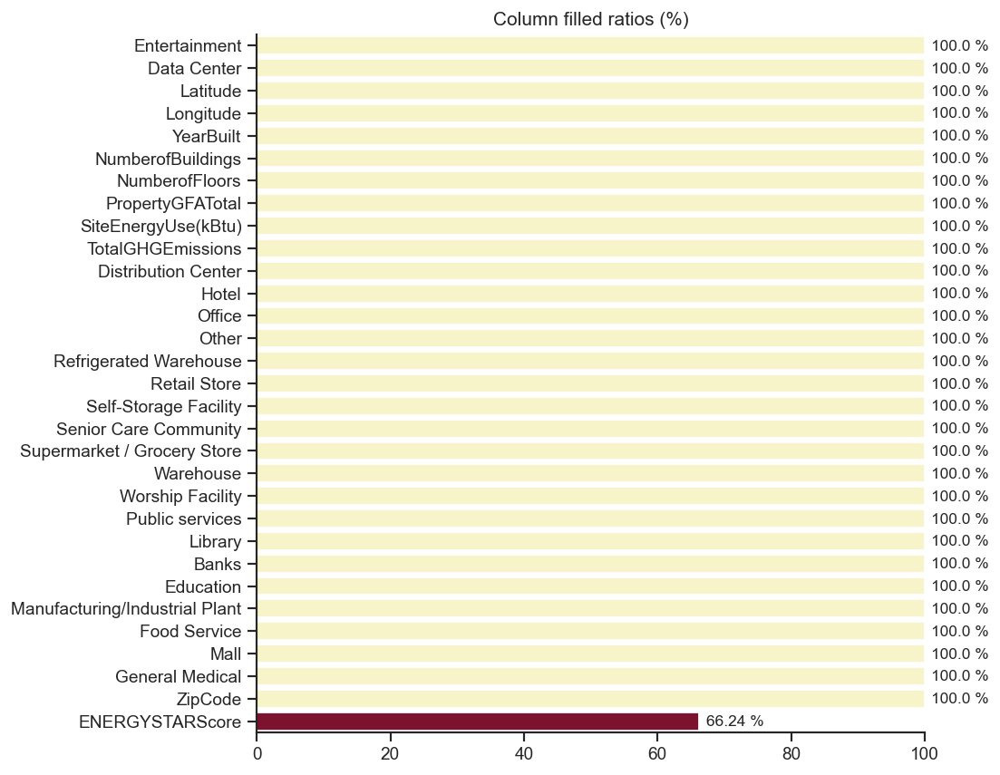

Wall time: 699 ms


In [148]:
%%time

cols_filled_ratio = data_filled_ratio(data_cleaned)[0]

fig = plt.figure(figsize=(9, 7), dpi=125)

sns_graphic_bar(cols_filled_ratio, x_threshold=1, y_threshold=-0.225, hide_fig_frame=['right', 'top'], rev = True,
                show_bars_len = True, unit='%')

plt.title('Column filled ratios (%)')
plt.xlabel(None)
plt.xlim(0,100)

plt.tight_layout()
fig.savefig(export_fig_path(fig, fig_title_suffix=' End_Cleaning'))

plt.show()

In [159]:
print("At the end of the feature engineering remains", cols_filled_ratio.count()[0], "features:\n"
      "3 geolocalisation features, 2 features for the explicatives, the feature representing the year built and 25 structural features.")


At the end of the feature engineering remains 31 features:
3 geolocalisation features, 2 features for the explicatives, the feature representing the year built and 25 structural features.


## 13) Export the preprocessed dataset in CSV format

In [149]:
# CSV export.
data_cleaned.to_csv(os.path.join("Exports", "data_preprocessed.csv"), sep='\t', encoding='utf-8')